# Figures for Paper Pollak et al. 2025

This Jupyter Notebook contains all the code needed to recreate the figures (and supplementary figures) from Pollak et al. 2025

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import pandas as pd
import pickle
import math
import matplotlib.cm as cm
import matplotlib.patches as mpatches
import matplotlib.gridspec as gridspec
from sklearn.metrics import mean_absolute_error, r2_score, root_mean_squared_error
from astropy.timeseries import LombScargle
from scipy.stats import pearsonr
import pyleoclim as pyleo
import seaborn as sns
sns.set_theme()
%matplotlib widget


# Define color
import tol_colors as tc
bright = tc.tol_cset('bright')


# # Increase Jupyter width to full screen
# from IPython.display import display, HTML
# display(HTML("<style>.container { width:100% !important; }</style>"))

from matplotlib import rc
rc('font',**{'family':'sans-serif','sans-serif':['Arial']})

%matplotlib widget


## 1. Figure 1 - Model comparison 2.6 Myr

In [4]:
# load pickled data sets
with open('Data/RAMP78_2,6Myr_Berends.pkl', 'rb') as file:
    RAMP78_Berends_data = pickle.load(file)

with open('Data/RAMP78_2,6Myr_Rohling.pkl', 'rb') as file:
    RAMP78_Rohling_data = pickle.load(file)
    
# calculate the rmse
rmse_ramp78_berends = root_mean_squared_error(y_pred=RAMP78_Berends_data['icevolume'][:len(RAMP78_Berends_data['sea'])], y_true=RAMP78_Berends_data['sea'])
rmse_ramp78_rohling = root_mean_squared_error(y_pred=RAMP78_Rohling_data['icevolume'][:len(RAMP78_Rohling_data['sea'])], y_true=RAMP78_Rohling_data['sea'])

r2_ramp78_berends = r2_score(y_pred=RAMP78_Berends_data['icevolume'][:len(RAMP78_Berends_data['sea'])], y_true=RAMP78_Berends_data['sea'])
r2_ramp78_rohling = r2_score(y_pred=RAMP78_Rohling_data['icevolume'][:len(RAMP78_Rohling_data['sea'])], y_true=RAMP78_Rohling_data['sea'])

R_ramp78_berends = pearsonr(RAMP78_Berends_data['icevolume'][:len(RAMP78_Berends_data['sea'])], RAMP78_Berends_data['sea'])[0]
R_ramp78_rohling = pearsonr(RAMP78_Rohling_data['icevolume'][:len(RAMP78_Rohling_data['sea'])], RAMP78_Rohling_data['sea'])[0]

print(f'RMSE (Berends) = {rmse_ramp78_berends:.2f}m\t RMSE (Rohling) = {rmse_ramp78_rohling:.2f}m')
print(f'R2 (Berends) = {r2_ramp78_berends:.2f}\t R2 (Rohling) = {r2_ramp78_rohling:.2f}')
print(f'R (Berends) = {R_ramp78_berends:.2f}\t R (Rohling) = {R_ramp78_rohling:.2f}')

RMSE (Berends) = 12.29m	 RMSE (Rohling) = 12.74m
R2 (Berends) = 0.74	 R2 (Rohling) = 0.72
R (Berends) = 0.86	 R (Rohling) = 0.85


In [5]:
# First 104 MIS boundaries according to LR04 - till 2614ka
mis_bounds = pd.read_csv('Data/LR04_MISboundaries.txt', skiprows=2, delimiter='\t\t', usecols=[1], header=None)    #dtype={'a': str, 'b': np.float64}, 
mis_bounds = mis_bounds.iloc[:109,0].to_numpy()

bounds = []
j=1
for i, bound in enumerate(mis_bounds):
    if i==0:
        bounds.append([0,bound,str(j)])
    elif j==4:
        j=j+1
        bounds.append([71.0,130.0,str(j)])
    else:
        if np.isfinite(mis_bounds[i-1]) and np.isfinite(bound):
            j=j+1
            bounds.append([mis_bounds[i-1],bound,str(j)])

bounds

[[0, 14.0, '1'],
 [14.0, 29.0, '2'],
 [29.0, 57.0, '3'],
 [57.0, 71.0, '4'],
 [71.0, 130.0, '5'],
 [130.0, 191.0, '6'],
 [191.0, 243.0, '7'],
 [243.0, 300.0, '8'],
 [300.0, 337.0, '9'],
 [337.0, 374.0, '10'],
 [374.0, 424.0, '11'],
 [424.0, 478.0, '12'],
 [478.0, 533.0, '13'],
 [533.0, 563.0, '14'],
 [563.0, 621.0, '15'],
 [621.0, 676.0, '16'],
 [676.0, 712.0, '17'],
 [712.0, 761.0, '18'],
 [761.0, 790.0, '19'],
 [790.0, 814.0, '20'],
 [814.0, 866.0, '21'],
 [866.0, 900.0, '22'],
 [900.0, 917.0, '23'],
 [917.0, 936.0, '24'],
 [936.0, 959.0, '25'],
 [959.0, 970.0, '26'],
 [970.0, 982.0, '27'],
 [982.0, 1014.0, '28'],
 [1014.0, 1031.0, '29'],
 [1031.0, 1062.0, '30'],
 [1062.0, 1081.0, '31'],
 [1081.0, 1104.0, '32'],
 [1104.0, 1114.0, '33'],
 [1114.0, 1141.0, '34'],
 [1141.0, 1190.0, '35'],
 [1190.0, 1215.0, '36'],
 [1215.0, 1244.0, '37'],
 [1244.0, 1264.0, '38'],
 [1264.0, 1286.0, '39'],
 [1286.0, 1304.0, '40'],
 [1304.0, 1320.0, '41'],
 [1320.0, 1344.0, '42'],
 [1344.0, 1362.0, '43'],
 

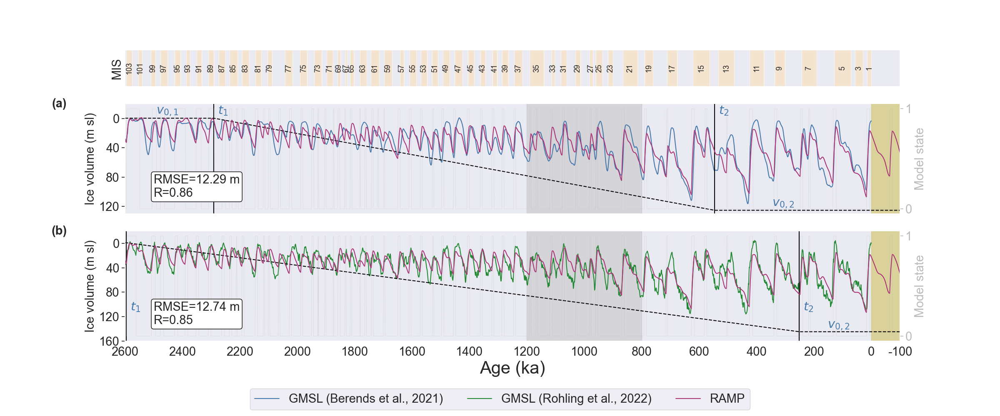

In [27]:
font = 21
title = None

future_time=100

# use seaborn theme
# sns.set_theme()
sns.set_style("dark")

# switch off seaborn theme
# plt.rcdefaults()

plt.close('all')
layout = [
    ["A"],
    ["B"],
    ["C"]
]

fig, ax = plt.subplot_mosaic(layout, figsize=(24,10), height_ratios=[1,3,3])
# fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(16,14), sharex=True, height_ratios=[1,3,3,3])
# fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(24,14), sharex=True)

##############################################################################################################################################
# 0st plot: MIS bounds
##############################################################################################################################################
for start, end, label in bounds:
    if start<=2600 and (int(label)%2!=0):
        ax['A'].axvspan(start, end, facecolor='navajowhite', edgecolor=None, alpha=0.5)
        if ((start+end)/2)<=2600:
            # ax['A'].text(start+(end-start)/4, 0.5, label, ha='center', va='center', fontsize=8, rotation=90)
            ax['A'].text((end+start)/2, 0.5, label, ha='center', va='center', fontsize=font-8, rotation=90)
ax['A'].set_xlim(2600, -100)
ax['A'].set_ylim(0, 1)
# ax['A'].set_xticks([])
ax['A'].set_yticks([])
ax['A'].set_ylabel('MIS', fontsize=font)
ax['A'].set_xticks([])

##############################################################################################################################################
# 1st plot: Berends
##############################################################################################################################################
ax['B'].plot(RAMP78_Berends_data['time_sea'], RAMP78_Berends_data['sea'], linestyle="-" , color=bright.blue, label="GMSL (Berends et al., 2021)")
ax['B'].plot(RAMP78_Berends_data['time_bounds'], RAMP78_Berends_data['v0s'], linestyle="--" , color=bright.black)
ax['B'].plot(RAMP78_Berends_data['time'], RAMP78_Berends_data['icevolume'], color=bright.purple, zorder=10)
ax['B'].axvspan(1200, 800, color=bright.grey, alpha=0.45, zorder=1)
if future_time>0:
    ax['B'].axvspan(0, -250, color=bright.yellow, alpha=0.5)
ax['B'].vlines(x=RAMP78_Berends_data['t2'], ymin=RAMP78_Berends_data['v0s'].min()-40, ymax=130, linestyle='-', color=bright.black)
ax['B'].vlines(x=RAMP78_Berends_data['t1'], ymin=RAMP78_Berends_data['v0s'].min()-40, ymax=130, linestyle='-', color=bright.black)
ax['B'].text(x=RAMP78_Berends_data['t2']+200, y=np.min(RAMP78_Berends_data['v0s'])-6, s=r'$v_{0,1}$', color=bright.blue, fontsize=font)
ax['B'].text(x=RAMP78_Berends_data['t1']-200, y=np.max(RAMP78_Berends_data['v0s'])-6, s=r'$v_{0,2}$', color=bright.blue, fontsize=font)
ax['B'].text(x=RAMP78_Berends_data['t2']-15, y=-6, s=r'$t_{1}$', color=bright.blue, fontsize=font)
ax['B'].text(x=RAMP78_Berends_data['t1']-15, y=-6, s=r'$t_{2}$', color=bright.blue, fontsize=font)

ax2 = ax['B'].twinx()
ax2.plot(RAMP78_Berends_data['time'], RAMP78_Berends_data['state'], linewidth = 0.4, alpha=0.5, color=bright.grey, zorder=2)
ax2.set_ylabel('Model state', color=bright.grey)

ax2.set_yticks([1,0])
plt.yticks(fontsize=font)
ax2.tick_params(axis='y', colors=bright.grey)

ax2.text(x=2500, y=0.12, s=f"RMSE={rmse_ramp78_berends:.2f} m\nR={R_ramp78_berends:.2f}", fontsize=font, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.2'))

# ax['B'].set_xlim(-RAMP78_Berends_data['start_year'],-RAMP78_Berends_data['future_time'])
ax['B'].set_xlim(-RAMP78_Berends_data['start_year'], -future_time)
# ax['B'].set_ylim(np.min([np.min(ORB_data['v0']), np.min(ORB_data['icevolume']), np.min(ORB_data['sea'])])-10,
#                np.max([np.max(ORB_data['v0']), np.max(ORB_data['icevolume']), np.max(ORB_data['sea'])])+10)

ax['B'].set_ylim(-20, 130)

ax['B'].invert_yaxis()
ax['B'].set_ylabel("Ice volume (m sl)", fontsize=font)
# ax['B'].text(-0.05, 0.3, 'Ice volume (m sl)', rotation=90, transform=ax['B'].transAxes, fontsize=font)
# ax['B'].text(-0.07, 0.2, 'RAMP model', color=bright.black, rotation=90, transform=ax['B'].transAxes, fontsize=font)
ax['B'].set_xticks([])

ax2.set_ylabel('Model state', fontsize=font)


##############################################################################################################################################
# 2nd plot: Rohling
##############################################################################################################################################
ax['C'].plot(RAMP78_Rohling_data['time_sea'], RAMP78_Rohling_data['sea'], linestyle="-" , color=bright.green, label='GMSL (Rohling et al., 2022)')
ax['C'].plot(RAMP78_Rohling_data['time_bounds'], RAMP78_Rohling_data['v0s'], linestyle="--" , color=bright.black)
ax['C'].plot(RAMP78_Rohling_data['time'], RAMP78_Rohling_data['icevolume'], color=bright.purple, zorder=10, label='RAMP')
ax['C'].axvspan(1200, 800, color=bright.grey, alpha=0.45, zorder=1)
if future_time>0:
    ax['C'].axvspan(0, -250, color=bright.yellow, alpha=0.5)
ax['C'].vlines(x=RAMP78_Rohling_data['t2'], ymin=RAMP78_Rohling_data['v0s'].min()-40, ymax=170, linestyle='-', color=bright.black)
ax['C'].vlines(x=RAMP78_Rohling_data['t1'], ymin=RAMP78_Rohling_data['v0s'].min()-40, ymax=170, linestyle='-', color=bright.black)
# ax['C'].text(x=RAMP78_Rohling_data['t2']+200, y=np.min(RAMP78_Rohling_data['v0s'])-6, s=r'$v_{0,1}$', color=bright.blue, fontsize=font)
ax['C'].text(x=RAMP78_Rohling_data['t1']-100, y=np.max(RAMP78_Rohling_data['v0s'])-6, s=r'$v_{0,2}$', color=bright.blue, fontsize=font)
ax['C'].text(x=RAMP78_Rohling_data['t2']-15, y=110, s=r'$t_{1}$', color=bright.blue, fontsize=font)
ax['C'].text(x=RAMP78_Rohling_data['t1']-15, y=110, s=r'$t_{2}$', color=bright.blue, fontsize=font)

ax2 = ax['C'].twinx()
ax2.plot(RAMP78_Rohling_data['time'], RAMP78_Rohling_data['state'], linewidth = 0.4, alpha=0.5, color=bright.grey, zorder=2)
ax2.set_ylabel('Model state', color=bright.grey)

ax2.set_yticks([1,0])
plt.yticks(fontsize=font)
ax2.tick_params(axis='y', colors=bright.grey)

# ax2.text(x=1050, y=0.9, s='MPT', color=bright.black, fontsize=font)
ax2.text(x=2500, y=0.12, s=f"RMSE={rmse_ramp78_rohling:.2f} m\nR={R_ramp78_rohling:.2f}", fontsize=font, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.2'))

# ax['C'].set_xlim(-RAMP78_Rohling_data['start_year'],-RAMP78_Rohling_data['future_time'])
ax['C'].set_xlim(-RAMP78_Rohling_data['start_year'], -future_time)
# ax['C'].set_ylim(np.min([np.min(ORB_data['v0']), np.min(ORB_data['icevolume']), np.min(ORB_data['sea'])])-10,
#                np.max([np.max(ORB_data['v0']), np.max(ORB_data['icevolume']), np.max(ORB_data['sea'])])+10)

ax['C'].set_ylim(-20, 130)

ax['C'].invert_yaxis()
ax['C'].set_ylabel("Ice volume (m sl)", fontsize=font)
# ax['C'].text(-0.05, 0.3, 'Ice volume (m sl)', rotation=90, transform=ax['B'].transAxes, fontsize=font)
# ax['C'].text(-0.07, 0.2, 'RAMP model', color=bright.black, rotation=90, transform=ax['B'].transAxes, fontsize=font)
ax['C'].set_xticks([])

ax2.set_ylabel('Model state', fontsize=font)



# ##############################################################################################################################################
# ##############################################################################################################################################
# ##############################################################################################################################################

ax['C'].set_xticks([2600,2400,2200,2000,1800,1600,1400,1200,1000,800,600,400,200,0, -100], 
                   ['2600','2400','2200','2000','1800','1600','1400','1200','1000','800','600','400','200','0', '-100'], 
                   fontsize=font)
plt.yticks(fontsize=font)
ax['C'].set_xlabel("Age (ka)", fontsize=30)
ax['B'].grid(False)
ax['C'].grid(False)


# Add panel label 
panel_label =['(a)', '(b)']
for i, row in enumerate(['B', 'C']):
    ax[row].text(-0.075, 1.05, panel_label[i], transform=ax[row].transAxes, fontsize=font, fontweight='bold', va='top', ha='right')
    
    if row == 'B':
        ax[row].set_yticks([0,40,80,120],
                           ['0','40','80','120'],
                           fontsize=font)
    if row == 'C':
        ax[row].set_yticks([0,40,80,120,160],
                           ['0','40','80','120','160'],
                           fontsize=font)


fig.legend(ncol=4, loc=8, fontsize=font)
# plt.tight_layout()
plt.subplots_adjust(bottom=0.18)

if title!=None:
    plt.title(title, fontsize=15)

plt.savefig('Plots/f01.pdf', bbox_inches='tight') #, facecolor=(1,1,1,0)
plt.show()

In [32]:
# Analysis of next glacial cycle and t1/t2 data
names = ['Berends', 'Rohling']

for i, data in enumerate([RAMP78_Berends_data, RAMP78_Rohling_data]): 
    t1 = data['t1']
    t2 = data['t2']
    states = data['state']
    time = data['time']
    diff_states = np.diff(states)
    np.shape(states), np.shape(diff_states)
    
    state_changes_id = np.where(diff_states!=0)[0]

    print(data['icevolume'][:2601][-15:])
    print(data['sea'][:26001:10][-15:])
    
    print(f'{names[i]}:\nt1={t1:.1f}, t2={t2:.1f}\n{time[state_changes_id][-9:]}\n')

[67.79277144 57.74978441 48.9469454  41.26813607 34.61685149 28.90682379
 24.05727459 19.99233538 16.63438615 16.87241765 17.30425351 17.92110942
 18.70288408 19.62312478 20.64832179]
[93.39 55.1   2.63 18.16 34.49 33.13 39.33 51.75 71.7  63.25 66.81 80.15
 95.41 29.59  3.32]
Berends:
t1=546.1, t2=2290.8
[ 123.   17.    6.  -64.  -73. -153. -162. -225. -234.]

[72.80027446 62.28376671 53.00893949 44.87066951 37.7818615  31.66382904
 26.44150023 22.04308991 18.3931842  18.53394508 18.8903063  19.45405475
 20.20457687 21.11418463 22.1473465 ]
[1.00974146e+02 2.39386244e+01 1.14514074e+01 4.57007285e+01
 2.71877059e+01 4.89566304e+01 4.39564771e+01 6.89661625e+01
 6.37238612e+01 6.21619647e+01 7.37426364e+01 8.89358546e+01
 1.06022047e+02 3.90891053e+01 1.80000000e-02]
Rohling:
t1=251.9, t2=2595.8
[ 123.   17.    6.  -64.  -73. -153. -162. -226. -235.]



## 2. Figure 2 - Scalograms

In [8]:
# You can also set specific font sizes for different elements
font = 18
plt.rcParams['axes.titlesize'] = font  # Font size for axis titles
plt.rcParams['axes.labelsize'] = font  # Font size for axis labels
plt.rcParams['xtick.labelsize'] = font # Font size for x-axis tick labels
plt.rcParams['ytick.labelsize'] = font # Font size for y-axis tick labels
plt.rcParams['legend.fontsize'] = font# Font size for legend
plt.rcParams['figure.titlesize'] = font # Font size for figure title (if used)

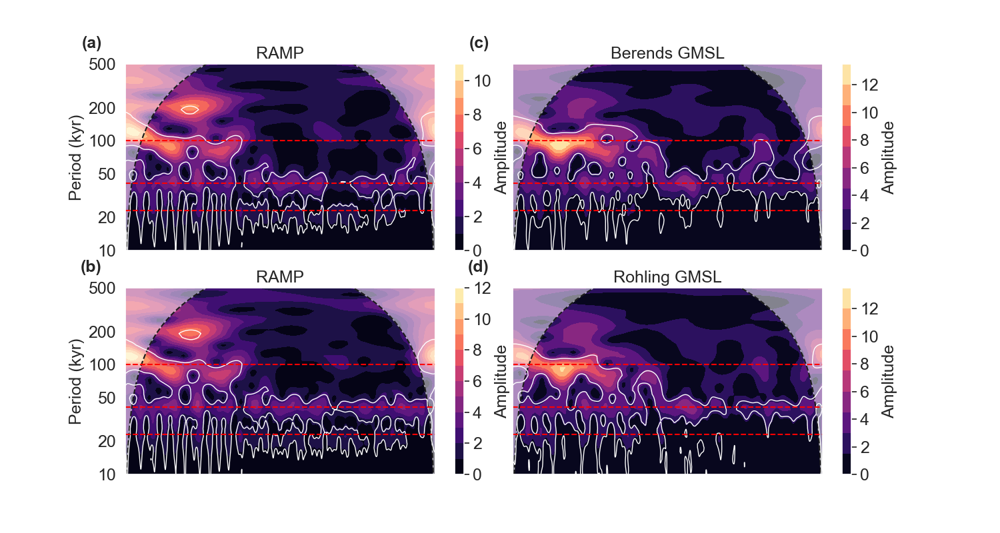

In [9]:
title = None

future_time=100
font=18

# use seaborn theme
# sns.set_theme()
sns.set_style("dark")

# switch off seaborn theme
# plt.rcdefaults()

plt.close('all')
layout = [
    ["A", "C"],
    ["B", "D"]
]

fig, ax = plt.subplot_mosaic(layout, figsize=(15,8))
# fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(16,14), sharex=True, height_ratios=[1,3,3,3])
# fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(24,14), sharex=True)


##############################################################################################################################################
# 1st plot: Berends
##############################################################################################################################################

# SCALOGRAM - RAMP
#############
# IEVOLUME
ts_icevolume = pyleo.Series(time=RAMP78_Berends_data['time'][:-250], value=RAMP78_Berends_data['icevolume'][:-250], 
                            time_name='Age', time_unit='ka', 
                            value_name='Icevolume', value_unit='m Sl', 
                            verbose=False)
# psd_icevolume = ts_icevolume.spectral()
scal_sig_ar1asym_icevolume = ts_icevolume.wavelet(freq_kwargs={'fmin':1/500,'fmax':1/10,'nf':50}).signif_test(method='ar1asym')

# fig, ax = ts_icevolume.summary_plot(psd_icevolume.beta_est(), scal_sig_ar1asym_icevolume, figsize=(20,8))
scal_sig_ar1asym_icevolume.plot(figsize=(20,8), ax=ax['A'], xlabel='', ylabel='Period (kyr)', title='RAMP', plot_cb=True, cbar_style={'ticks':np.arange(0,13,2)})
ax['A'].set_xticks(np.hstack([0, np.arange(0, -RAMP78_Berends_data['start_year']+1, 200)]))
ax['A'].hlines(y=[23, 41, 100], xmin=0, xmax=-RAMP78_Berends_data['start_year'], colors='red', linestyles='--')
# ax['A'].vlines(0, 10, 500, colors='grey', linestyles='--', linewidth=3)
ax['A'].set_xticks([])

# SCALOGRAM - Berends
#############
# IEVOLUME
ts_icevolume = pyleo.Series(time=RAMP78_Berends_data['time_sea'], value=RAMP78_Berends_data['sea'], 
                            time_name='Age', time_unit='ka', 
                            value_name='Icevolume', value_unit='m Sl', 
                            verbose=False)
# psd_icevolume = ts_icevolume.spectral()
scal_sig_ar1asym_icevolume = ts_icevolume.wavelet(freq_kwargs={'fmin':1/500,'fmax':1/10,'nf':50}).signif_test(method='ar1asym')

scal_sig_ar1asym_icevolume.plot(figsize=(20,8), ax=ax['C'], xlabel='', ylabel='', yticks=[], title='Berends GMSL', plot_cb=True, cbar_style={'ticks':np.arange(0,13,2)})
ax['C'].set_xticks(np.hstack([0, np.arange(0, -RAMP78_Berends_data['start_year']+1, 200)]))
ax['C'].hlines(y=[23, 41, 100], xmin=0, xmax=-RAMP78_Berends_data['start_year'], colors='red', linestyles='--')
# ax['C'].vlines(0, 10, 500, colors='grey', linestyles='--', linewidth=3)
ax['C'].set_xticks([])

##############################################################################################################################################
# 2nd plot: Rohling
##############################################################################################################################################

##################
# SCALOGRAM - RAMP
##################
# IEVOLUME
ts_icevolume = pyleo.Series(time=RAMP78_Rohling_data['time'][:-250], value=RAMP78_Rohling_data['icevolume'][:-250], 
                            time_name='Age', time_unit='ka', 
                            value_name='Icevolume', value_unit='m Sl', 
                            verbose=False)
# psd_icevolume = ts_icevolume.spectral()
scal_sig_ar1asym_icevolume = ts_icevolume.wavelet(freq_kwargs={'fmin':1/500,'fmax':1/10,'nf':50}).signif_test(method='ar1asym')

# fig, ax = ts_icevolume.summary_plot(psd_icevolume.beta_est(), scal_sig_ar1asym_icevolume, figsize=(20,8))
scal_sig_ar1asym_icevolume.plot(figsize=(20,8), ax=ax['B'], xlabel='', ylabel='Period (kyr)', title='RAMP', plot_cb=True, cbar_style={'ticks':np.arange(0,13,2)})
ax['B'].set_xticks(np.hstack([0, np.arange(0, -RAMP78_Rohling_data['start_year']+1, 200)]))
ax['B'].hlines(y=[23, 41, 100], xmin=0, xmax=-RAMP78_Rohling_data['start_year'], colors='red', linestyles='--')
# ax['B'].vlines(0, 10, 500, colors='grey', linestyles='--', linewidth=3)
ax['B'].set_xticks([])

##################
# SCALOGRAM - Rohling
##################
# IEVOLUME
ts_icevolume = pyleo.Series(time=RAMP78_Rohling_data['time_sea'], value=RAMP78_Rohling_data['sea'], 
                            time_name='Age', time_unit='ka', 
                            value_name='Icevolume', value_unit='m Sl', 
                            verbose=False)
# psd_icevolume = ts_icevolume.spectral()
scal_sig_ar1asym_icevolume = ts_icevolume.wavelet(freq_kwargs={'fmin':1/500,'fmax':1/10,'nf':50}).signif_test(method='ar1asym')

# fig, ax = ts_icevolume.summary_plot(psd_icevolume.beta_est(), scal_sig_ar1asym_icevolume, figsize=(20,8))
scal_sig_ar1asym_icevolume.plot(figsize=(20,8), ax=ax['D'], xlabel='', ylabel='', yticks=[], title='Rohling GMSL', plot_cb=True, cbar_style={'ticks':np.arange(0,13,2)})
ax['D'].set_xticks(np.hstack([0, np.arange(0, -RAMP78_Rohling_data['start_year']+1, 200)]))
ax['D'].hlines(y=[23, 41, 100], xmin=0, xmax=-RAMP78_Rohling_data['start_year'], colors='red', linestyles='--')
# ax['D'].vlines(0, 10, 500, colors='grey', linestyles='--', linewidth=3)
ax['D'].set_xticks([])


# ##############################################################################################################################################
# ##############################################################################################################################################
# ##############################################################################################################################################


# Add panel label 
panel_label =['(a)', '(b)', '(c)', '(d)']
for i, row in enumerate(['A', 'B', 'C', 'D']):
    ax[row].text(-0.075, 1.15, panel_label[i], transform=ax[row].transAxes, fontsize=font, fontweight='bold', va='top', ha='right')


# fig.legend(ncol=4, loc=8, fontsize=font)
# plt.tight_layout()
plt.subplots_adjust(wspace=0)

if title!=None:
    plt.title(title, fontsize=font)
plt.savefig('Plots/f02.pdf', bbox_inches='tight') #, facecolor=(1,1,1,0)
plt.show()

## 3. Figure 3 - Orbital forcing RAMP

In [10]:
with open('Data/RAMP78_2,6Myr_Berends.pkl', 'rb') as file:
    RAMP_Berends_data = pickle.load(file)

with open('Data/RAMP78_2,6Myr_Rohling.pkl', 'rb') as file:
    RAMP_Rohling_data = pickle.load(file)

data = [RAMP_Berends_data, RAMP_Rohling_data]

In [11]:
Insolations = []

for RAMP_data in data:
    params = RAMP_data['params']
    time = RAMP_data['time']
    Esi = np.array(RAMP_data['Esi'])
    EnO = np.array(RAMP_data['EnO'])
    esinomega = np.array(RAMP_data['esinomega'])
    O = np.array(RAMP_data['O'])
    icevolume = RAMP_data['icevolume']
    
    I = params['aEsi']*Esi + params['aO']*EnO
    Insolations.append(I)


In [12]:
# Define a converter for Fortran-style double precision
def fortran_to_float(value):
    return float(value.decode('utf-8').replace('D', 'E'))


def normalise(sample):
    m = np.mean(sample)
    std = np.std(sample)
    if std==0:
        norm = (sample-m)
    else:
        norm = (sample-m)/std
    return norm
    

def plot_insolation(file_name=None, model_insolation=None, normalised=True, threshold=None, label=None, title=None):
    # load date
    data = np.loadtxt(file_name, usecols=[0,threshold+1])
    age = data[:,0]
    ins = data[:,1]
    ins_norm = normalise(ins)

    # create plot
    plt.figure(figsize=(15,6))
    if np.all(model_insolation!=None):
        plt.plot(time, model_insolation, label=r'Model insolation I', alpha=1)
        # plt.plot(time, insolation_threshold_norm, label=r'Model Insolation', alpha=1)

        # calculate statistics
        rmse = root_mean_squared_error(model_insolation[:len(ins_norm)], ins_norm)
        # rmses[i] = root_mean_squared_error(insolation_threshold_norm, ins_norm)
        R2 = r2_score(y_pred=model_insolation[:len(ins_norm)], y_true=ins_norm)
            
    ################################################################################
    ################################################################################
    if normalised:
        plt.axhline(xmin=time.min(), xmax=time.max(), y=0, color='grey', linestyle='--')
        if label==None:
            plt.plot(age, ins_norm, label=file_name, alpha=0.75)
        else:
            plt.plot(age, ins_norm, label=label, alpha=0.75)
        plt.ylabel('Insolation (normalized)')
    else:
        if label==None:
            plt.plot(age, ins, label=file_name, alpha=0.75)
        else:
            plt.plot(age, ins, label=label, alpha=0.75)
        plt.ylabel('Ice volume (m.s.l.e.)')
            
    plt.xlim(0, time.max())
    plt.xlabel('Age (ka)')
    if np.all(model_insolation!=None) and normalised:
        plt.text(x=2450, y=-2.7, s=f"RMSE = {rmse:.2f}\nR² = {R2:.2f}", bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.2'))
    plt.gca().invert_xaxis()
    plt.legend(loc=8, ncols=2)
    if title!=None:
        plt.title(title)    
    else:
        plt.title(f'Insolation curve')
    plt.tight_layout()
    plt.show()

    return ins_norm

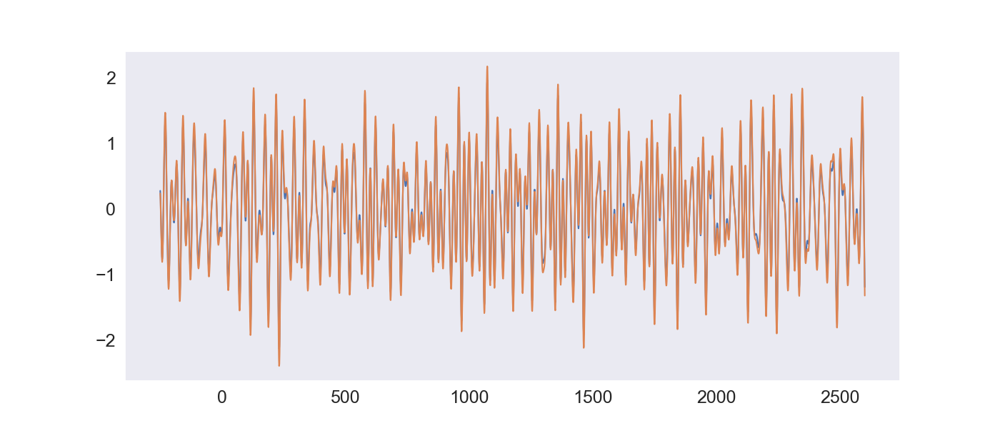

In [13]:
plt.close('all')
plt.figure(figsize=(14,6))
for I in Insolations:
    plt.plot(time, I)
plt.show()

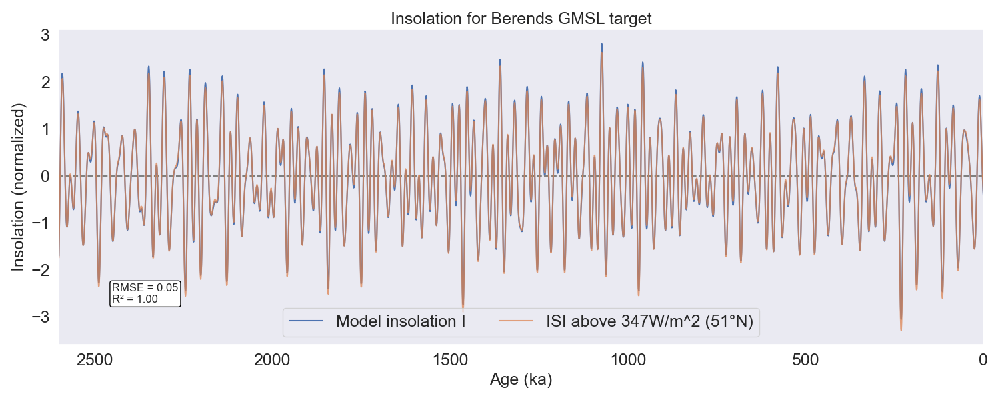

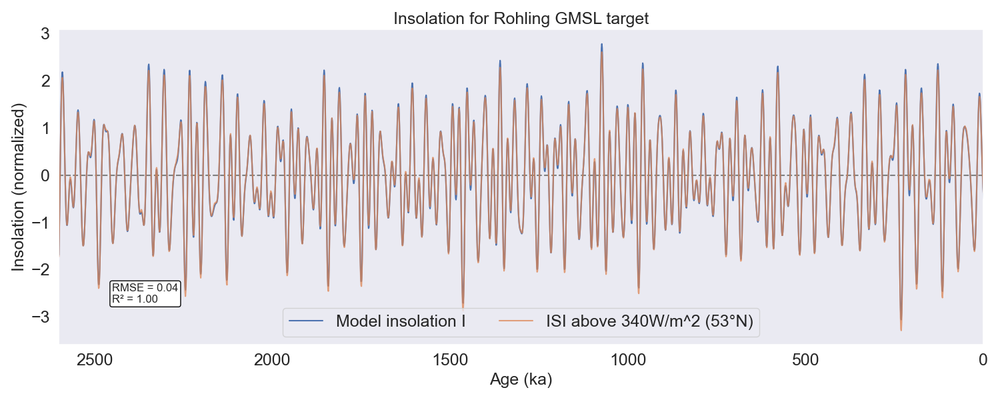

In [14]:
I_solutions = [
               # (52, 344, 'Insolation for detrended Prob-stack target'),
               (51, 347, 'Insolation for Berends GMSL target'),
               (53, 340, 'Insolation for Rohling GMSL target'),
               # (53, 339, r'Insolation for Clark $\delta^{18}$O$_{sw}$ target')
]


for i, I in enumerate(Insolations):
    ins_norm = plot_insolation(file_name=f'Data/ISI_above_0-1000_lat_{I_solutions[i][0]}.txt', model_insolation=normalise(I), normalised=True, threshold=I_solutions[i][1], label=f'ISI above {I_solutions[i][1]}W/m^2 ({I_solutions[i][0]}°N)', title=I_solutions[i][2])

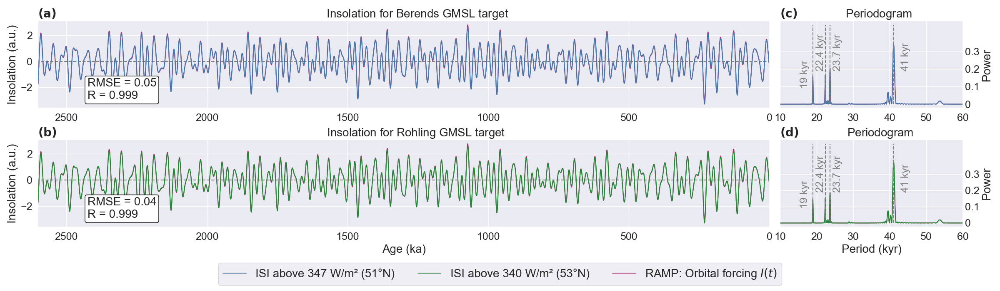

In [15]:
#### plt.close('all')
I_solutions = [
               # (52, 344, 'Insolation for detrended Prob-stack target'),
               (51, 347, 'Insolation for Berends GMSL target'),
               (53, 340, 'Insolation for Rohling GMSL target'),
               # (53, 339, r'Insolation for Clark $\delta^{18}$O$_{sw}$ target')
]

font=20
colors = [bright.blue, bright.green]
panel_labels = [('a', 'e'), ('b', 'f'), ('c', 'g'), ('d', 'h')]
panel_labels = [('a', 'c'), ('b', 'd')]

fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(24,7), gridspec_kw={'width_ratios': [4, 1]})

####################################
# PLOT OF INSOLATION
####################################

for i,I in enumerate(Insolations):
    # load date
    lat = I_solutions[i][0]
    threshold = I_solutions[i][1]
    
    
    data = np.loadtxt(f'Data/ISI_above_0-1000_lat_{lat}.txt', usecols=[0,threshold+1])
    age = data[:,0]
    ins = data[:,1]
    ins_norm = normalise(ins)
    
    I_model = normalise(I)
    # I_model = I
    
    # create plot
    
    # plt.plot(time, insolation_threshold_norm, label=r'Model Insolation', alpha=1)
    
    # calculate statistics
    rmse = root_mean_squared_error(I_model[:len(ins_norm)], ins_norm)
    # rmses[i] = root_mean_squared_error(insolation_threshold_norm, ins_norm)
    R = pearsonr(I_model[:len(ins_norm)], ins_norm)[0]
            
    # plot ISI
    ax[i,0].axhline(xmin=time.min(), xmax=time.max(), y=0, color='grey', linestyle='--')
    ax[i,0].plot(age, ins_norm, label=f'ISI above {threshold} W/m² ({lat}°N)', color=colors[i])
    if i==1:
        ax[i,0].plot(time, I_model, label=r'RAMP: Orbital forcing $I(t)$', color=bright.purple, zorder=1)
    else:
        ax[i,0].plot(time, I_model, color=bright.purple, zorder=1)
    ax[i,0].text(x=2425, y=-2.9, s=f"RMSE = {rmse:.2f}\nR = {R:.3f}", bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.2'), fontsize=font)
    
    ax[i,0].set_ylabel('Insolation (a.u.)', fontsize=font)      
    ax[i,0].set_xlim(0, time.max())
    
    ax[i,0].invert_xaxis()
    ax[i,0].set_title(rf"$\bf{{({panel_labels[i][0]})}}$ {f'{I_solutions[i][2]}':^200}", loc="left", fontsize=font)
    ax[i,0].grid(True)
    
    ####################################
    # PLOT OF PERIODOGRAM
    ####################################
    f_model, P_model = LombScargle(time[:len(ins_norm)], I_model[:len(ins_norm)], normalization='standard').autopower(minimum_frequency=1/150, maximum_frequency=1/10)
    f_ISI, P_ISI = LombScargle(age, ins_norm, normalization='standard').autopower(minimum_frequency=1/150, maximum_frequency=1/10)
    
    ax[i,1].plot(1/f_ISI, P_ISI, color=colors[i])
    ax[i,1].plot(1/f_model, P_model, color=bright.purple, zorder=1)
    # mark obliquity and precession cycles + 100 kyr
    ax[i,1].vlines([100, 41, 23.7, 22.4, 19], 0, np.max([P_model, P_ISI])+0.1, color='grey', linestyle='--')
    
    
    ax[i,1].yaxis.tick_right()
    ax[i,1].yaxis.set_label_position("right")
    # Remove tick marks (dashes) on the y-axis
    ax[i,1].tick_params(axis='y', which='both', length=0)
    ax[i,1].set_ylabel("Power", fontsize=font)  
    ax[i,1].set_yticks([0, 0.1, 0.2, 0.3], ['0', '0.1', '0.2', '0.3'])
    
    # ax[i,1].text(105, 0.2, '100 kyr', color='grey')
    ax[i,1].text(43, 0.2, '41 kyr', color='grey', rotation=90, fontsize=font-2)
    ax[i,1].text(24.5, 0.2, '23.7 kyr', color='grey', rotation=90, fontsize=font-2)
    ax[i,1].text(19.8, 0.2, '22.4 kyr', color='grey', rotation=90, fontsize=font-2)
    ax[i,1].text(15.5, 0.1, '19 kyr', color='grey', rotation=90, fontsize=font-2)
    
    ax[i,1].set_xlim(10,60)
    ax[i,1].set_title(rf"$\bf{{({panel_labels[i][1]})}}$ {'Periodogram':^40}", loc="left", fontsize=font)
    ax[i,1].grid(True)
    

ax[i,0].set_xlabel('Age (ka)', fontsize=font)
ax[i,1].set_xlabel("Period (kyr)", fontsize=font)  # , weight='bold'

fig.legend(loc=8, ncols=5, fontsize=font)
plt.tight_layout()
fig.subplots_adjust(bottom=0.22)  # Increase the bottom margin to make space for the legend
plt.savefig('Plots/f03.pdf', bbox_inches='tight')
plt.show()

## 4. Figure 4 - Sensitivity and GAP experiment

In [16]:
# load pickled data sets
with open('Data/RAMP78_2,6Myr_Berends_sensitivity.pkl', 'rb') as file:
    RAMP_data = pickle.load(file)

# GAP data
with open('Data/RAMP80_2,6Myr_Berends_Gap-2000-600.pkl', 'rb') as file:
    GAP_data = pickle.load(file)

# 2 Myr Berends run
with open('Data/RAMP80_2Myr_Berends.pkl', 'rb') as file:
    RAMP_2Myr_data = pickle.load(file)

# RAMP80 data for 2.6 Myr run on Berends 
with open('Data/RAMP80_2,6Myr_Berends.pkl', 'rb') as file:
    RAMP80_2600ka_data = pickle.load(file)

# 3 Myr Prob-stack run
with open('Data/RAMP80_3Myr_Berends.pkl', 'rb') as file:
    RAMP_3Myr_data = pickle.load(file)

names = ['2Myr: ', '2.6Myr: ', '3Myr: ']
for i, data in enumerate([RAMP_2Myr_data, RAMP80_2600ka_data, RAMP_3Myr_data]):
    print(f"{names[i]}t1: {data['t1']:.0f}, t2: {data['t2']:.0f}")

2Myr: t1: 1993, t2: 127
2.6Myr: t1: 2291, t2: 546
3Myr: t1: 2334, t2: 573


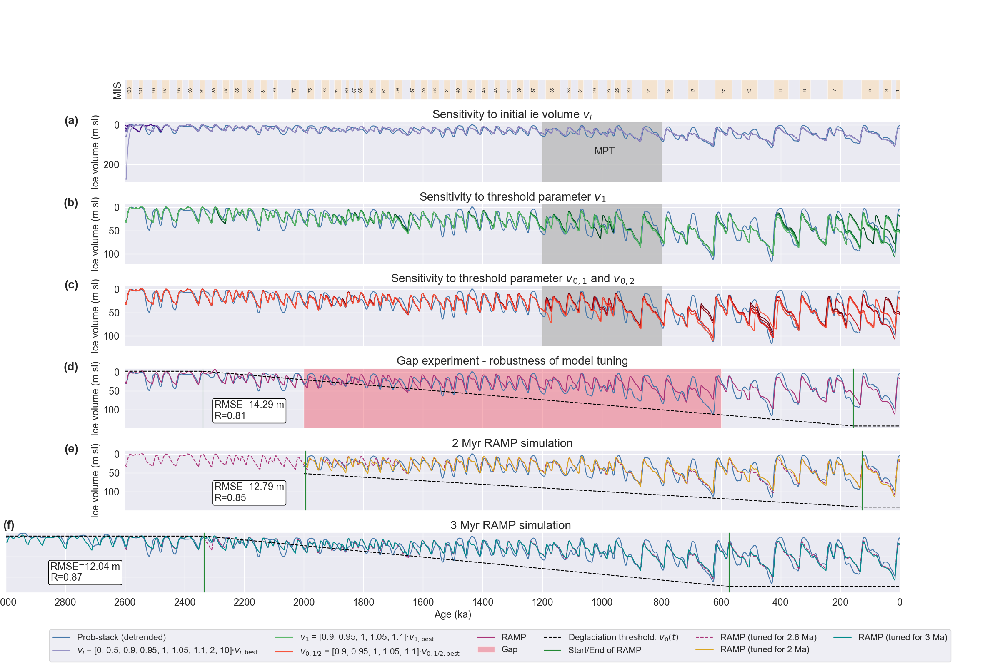

In [20]:
# Create figure and layout
fig = plt.figure(figsize=(24, 16))
gs = gridspec.GridSpec(7, 1, height_ratios=[1, 3, 3, 3, 3, 3, 3], figure=fig, hspace=0.4)

# Create subplots
ax1 = fig.add_subplot(gs[0])
ax2 = fig.add_subplot(gs[1], sharex=ax1)
ax3 = fig.add_subplot(gs[2], sharex=ax1)
ax4 = fig.add_subplot(gs[3], sharex=ax1)
ax5 = fig.add_subplot(gs[4], sharex=ax1)
ax6 = fig.add_subplot(gs[5], sharex=ax1)
ax7 = fig.add_subplot(gs[6])

# X limits
ax1.set_xlim(2600, 0)
ax7.set_xlim(3000, 0)

# Hide overlapping x-ticks
plt.setp(ax1.get_xticklabels(), visible=False)
plt.setp(ax2.get_xticklabels(), visible=False)
plt.setp(ax3.get_xticklabels(), visible=False)
plt.setp(ax4.get_xticklabels(), visible=False)
plt.setp(ax5.get_xticklabels(), visible=False)
plt.setp(ax6.get_xticklabels(), visible=False)

# --- Align axes geometrically ---
fig.canvas.draw()
transA = ax1.transData + fig.transFigure.inverted()
transC = ax7.transData + fig.transFigure.inverted()

x0_A_fig = transA.transform((2600, 0))[0]
x800_A_fig = transA.transform((0, 0))[0]
scale_ratio = (x800_A_fig - x0_A_fig) / 2600
total_width_C = scale_ratio * (800 - (-200))
total_width_C = scale_ratio * 3000
left_edge_C = x800_A_fig - total_width_C

posC = ax7.get_position()
ax7.set_position([left_edge_C, posC.y0, total_width_C, posC.height])


#################################################################################
# --- Plots ---

# ylabel = r"$\delta^{18}$O$_b$ (‰)"
ylabel = r"Ice volume (m sl)"
font = 17

##############################################################################################################################################
# 0st plot: MIS bounds
##############################################################################################################################################
for start, end, label in bounds:
    if start<=2600 and (int(label)%2!=0):
        ax1.axvspan(start, end, facecolor='navajowhite', edgecolor=None, alpha=0.5)
        if ((start+end)/2)<=2600:
            # ax1.text(start+(end-start)/4, 0.5, label, ha='center', va='center', fontsize=8, rotation=90)
            ax1.text((end+start)/2, 0.5, label, ha='center', va='center', fontsize=8, rotation=90)
ax1.set_ylim(0, 1)
ax1.set_yticks([])
ax1.set_ylabel('MIS')
ax1.set_xticks([])


##############################################################################################################################################
# 1st plot: vi - sensitivity
##############################################################################################################################################
cmap = cm.get_cmap("Purples_r", 9*2)

ax2.plot(RAMP_data['time_sea'], RAMP_data['sea'], linestyle="-" , color=bright.blue, label="Prob-stack (detrended)")
ax2.plot(RAMP_data['time'], RAMP_data['icevolume_vi_0'], color=cmap(0))
ax2.plot(RAMP_data['time'], RAMP_data['icevolume_vi_50'], color=cmap(1))
ax2.plot(RAMP_data['time'], RAMP_data['icevolume_vi_90'], color=cmap(2))
ax2.plot(RAMP_data['time'], RAMP_data['icevolume_vi_95'], color=cmap(3))
ax2.plot(RAMP_data['time'], RAMP_data['icevolume_vi_100'], color=cmap(4))
ax2.plot(RAMP_data['time'], RAMP_data['icevolume_vi_105'], color=cmap(5))
ax2.plot(RAMP_data['time'], RAMP_data['icevolume_vi_110'], color=cmap(6))
ax2.plot(RAMP_data['time'], RAMP_data['icevolume_vi_200'], color=cmap(7))
ax2.plot(RAMP_data['time'], RAMP_data['icevolume_vi_1000'], color=cmap(8), label=rf'$v_i$ = [0, 0.5, 0.9, 0.95, 1, 1.05, 1.1, 2, 10]$\cdot v_{{i,\text{{best}}}}$')
ax2.axvspan(1200, 800, color=bright.grey, alpha=0.8)
ax2.axvspan(0, -250, color=bright.yellow, alpha=0.5)

# ax2.text(x=2500, y=100, s=f"RMSE={rmse_ramp78_berends:.2f} m\nR={R_ramp78_berends:.2f}", fontsize=font, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.2'))
ax2.text(x=1025, y=150, s=f"MPT", fontsize=font)

ax2.set_xlim(-RAMP_data['start_year'], future_time)

# ax2.set_ylim(-20, 130)

ax2.invert_yaxis()
ax2.set_ylabel(ylabel, fontsize=font)
ax2.set_xticks([])

##############################################################################################################################################
# 2nd plot: v1 sensitivity
##############################################################################################################################################
cmap = cm.get_cmap("Greens_r", 5*2)

ax3.plot(RAMP_data['time_sea'], RAMP_data['sea'], linestyle="-" , color=bright.blue)
ax3.plot(RAMP_data['time'], RAMP_data['icevolume_v1_90'], color=cmap(0))
ax3.plot(RAMP_data['time'], RAMP_data['icevolume_v1_95'], color=cmap(1))
ax3.plot(RAMP_data['time'], RAMP_data['icevolume_v1_100'], color=cmap(2))
ax3.plot(RAMP_data['time'], RAMP_data['icevolume_v1_105'], color=cmap(3))
ax3.plot(RAMP_data['time'], RAMP_data['icevolume_v1_110'], color=cmap(4), label=rf'$v_1$ = [0.9, 0.95, 1, 1.05, 1.1]$\cdot v_{{1,\text{{best}}}}$')
ax3.axvspan(1200, 800, color=bright.grey, alpha=0.8)
ax3.axvspan(0, -250, color=bright.yellow, alpha=0.5)

# ax3.text(x=2500, y=100, s=f"RMSE={rmse_ramp78_berends:.2f} m\nR={R_ramp78_berends:.2f}", fontsize=font, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.2'))

ax3.set_xlim(-RAMP_data['start_year'], future_time)

# ax3.set_ylim(-20, 130)

ax3.invert_yaxis()
ax3.set_ylabel(ylabel, fontsize=font)
ax3.set_xticks([])

##############################################################################################################################################
# 4th plot: v0s sensitivity
##############################################################################################################################################
cmap = cm.get_cmap("Reds_r", 5*2)

ax4.plot(RAMP_data['time_sea'], RAMP_data['sea'], linestyle="-" , color=bright.blue)
ax4.plot(RAMP_data['time'], RAMP_data['icevolume_v0_90'], color=cmap(0))
ax4.plot(RAMP_data['time'], RAMP_data['icevolume_v0_95'], color=cmap(1))
ax4.plot(RAMP_data['time'], RAMP_data['icevolume_v0_100'], color=cmap(2))
ax4.plot(RAMP_data['time'], RAMP_data['icevolume_v0_105'], color=cmap(3))
ax4.plot(RAMP_data['time'], RAMP_data['icevolume_v0_110'], color=cmap(4), label=rf'$v_{{0,1/2}}$ = [0.9, 0.95, 1, 1.05, 1.1]$\cdot v_{{0,1/2,\text{{best}}}}$')
ax4.axvspan(1200, 800, color=bright.grey, alpha=0.8)
ax4.axvspan(0, -250, color=bright.yellow, alpha=0.5)


# ax4.text(x=2500, y=100, s=f"RMSE={rmse_ramp78_clark_d18Osw:.2f} ‰\nR={R_ramp78_clark_d18Osw:.2f}", fontsize=font, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.2'))

ax4.set_xlim(-RAMP_data['start_year'], 0)

# ax4.set_ylim(-0.2, 1.5)
ax4.invert_yaxis()
ax4.set_ylabel(ylabel, fontsize=font)

##############################################################################################################################################
# 4th plot: GAP
##############################################################################################################################################
ax5.plot(GAP_data["time_sea"], GAP_data["sea"], linestyle="-" , color=bright.blue)
ax5.plot(GAP_data["time"], GAP_data["icevolume"], color=bright.purple, label="RAMP")
ax5.axvspan(xmin=-GAP_data["gap"][0], xmax=-GAP_data["gap"][1], facecolor=bright.red, alpha=0.5, label='Gap')
ax5.axvspan(0, -250, color=bright.yellow, alpha=0.5)


ax5.plot(GAP_data["time_bounds"], GAP_data["v0s"], linestyle="--" , color=bright.black, label=r"Deglaciation threshold: $v_0(t)$")
    
ax5.vlines(x=GAP_data["t1"], ymin=-1000, ymax=1000, linestyle='-', color=bright.green)
ax5.vlines(x=GAP_data["t2"], ymin=-1000, ymax=1000, linestyle='-', color=bright.green, label=f'Start/End of RAMP')

# ax2 = ax5.twinx()
# ax2.plot(GAP_data["time"], GAP_data["state"], linewidth = 0.8, color=bright.grey, label='Model state')

# # plt.xticks([0,100,200,300,400,500,600,700,800,900,1000,1100,1200,1300,1400,1500,1600,1700,1800,1900,2000])
# # ax2.set_yticks([1,0], ['Interglacial', 'Glacial'], rotation=22.5)
# ax2.set_yticks([1,0])
ax5.set_xticks(np.arange(-GAP_data["start_year"], -GAP_data["future_time"]-1, -200))

plt.xlim(-GAP_data["start_year"],-GAP_data["future_time"])
# ax5.set_ylim(np.min([np.min(GAP_data["icevolume"]-0.1*np.abs(GAP_data["icevolume"])), np.min(GAP_data["sea"]-0.1*np.abs(GAP_data["sea"]))]), 
#              np.max([np.max(GAP_data["icevolume"]+0.1*np.abs(GAP_data["icevolume"])), np.max(GAP_data["sea"]+0.1*np.abs(GAP_data["sea"]))]))
ax5.set_ylim(-10, 150)
ax5.set_yticks([0, 50, 100])
# plt.gca().invert_yaxis()
ax5.invert_yaxis()
ax5.set_ylabel(ylabel, fontsize=font)
ax5.text(x=2300, y=125, s=f"RMSE={GAP_data['rmse']:.2f} m\nR={GAP_data['R']:.2f}", fontsize=font, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.2'))
# ax2.set_ylabel('Model state')


##############################################################################################################################################
# 5th plot: 2 Myr run
##############################################################################################################################################
ax6.plot(RAMP_2Myr_data["time_sea"], RAMP_2Myr_data["sea"], linestyle="-" , color=bright.blue)
ax6.plot(RAMP80_2600ka_data["time"], RAMP80_2600ka_data["icevolume"], '--', color=bright.purple, label="RAMP (tuned for 2.6 Ma)")
ax6.plot(RAMP_2Myr_data["time"], RAMP_2Myr_data["icevolume"], color='goldenrod', label="RAMP (tuned for 2 Ma)")
ax6.axvspan(0, -250, color=bright.yellow, alpha=0.5)


ax6.plot(RAMP_2Myr_data["time_bounds"], RAMP_2Myr_data["v0s"], linestyle="--" , color=bright.black)
    
ax6.vlines(x=RAMP_2Myr_data["t1"], ymin=-1000, ymax=1000, linestyle='-', color=bright.green)
ax6.vlines(x=RAMP_2Myr_data["t2"], ymin=-1000, ymax=1000, linestyle='-', color=bright.green)

# ax2 = ax6.twinx()
# ax2.plot(RAMP_2Myr_data["time"], RAMP_2Myr_data["state"], linewidth = 0.8, color=bright.grey, label='Model state')

# # plt.xticks([0,100,200,300,400,500,600,700,800,900,1000,1100,1200,1300,1400,1500,1600,1700,1800,1900,2000])
# # ax2.set_yticks([1,0], ['Interglacial', 'Glacial'], rotation=22.5)
# ax2.set_yticks([1,0])
ax6.set_xticks(np.arange(-RAMP_2Myr_data["start_year"], -RAMP_2Myr_data["future_time"]-1, -200))

# ax6.set_ylim(np.min([np.min(RAMP_2Myr_data["icevolume"]-0.2*np.abs(RAMP_2Myr_data["icevolume"])), np.min(RAMP_2Myr_data["sea"]-0.2*np.abs(RAMP_2Myr_data["sea"]))]), 
#              np.max([np.max(RAMP_2Myr_data["icevolume"]+0.2*np.abs(RAMP_2Myr_data["icevolume"])), np.max(RAMP_2Myr_data["sea"]+0.2*np.abs(RAMP_2Myr_data["sea"]))]))
ax6.set_ylim(-10, 150)
ax6.set_yticks([0, 50, 100])
# plt.gca().invert_yaxis()
ax6.invert_yaxis()
ax6.set_ylabel(ylabel, fontsize=font)
ax6.text(x=2300, y=125, s=f"RMSE={RAMP_2Myr_data['rmse']:.2f} m\nR={RAMP_2Myr_data['R']:.2f}", fontsize=font, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.2'))
# ax2.set_ylabel('Model state')


##############################################################################################################################################
# 6th plot: 3 Myr run
##############################################################################################################################################
ax7.plot(RAMP_3Myr_data["time_sea"], RAMP_3Myr_data["sea"], linestyle="-" , color=bright.blue)
ax7.plot(RAMP80_2600ka_data["time"], RAMP80_2600ka_data["icevolume"], '--', color=bright.purple)
ax7.plot(RAMP_3Myr_data["time"], RAMP_3Myr_data["icevolume"], color='darkcyan', label="RAMP (tuned for 3 Ma)")
ax7.axvspan(0, -250, color=bright.yellow, alpha=0.5)


ax7.plot(RAMP_3Myr_data["time_bounds"], RAMP_3Myr_data["v0s"], linestyle="--" , color=bright.black)
    
ax7.vlines(x=RAMP_3Myr_data["t1"], ymin=np.min([np.min(RAMP_3Myr_data["icevolume"]-0.2*np.abs(RAMP_3Myr_data["icevolume"])), np.min(RAMP_3Myr_data["sea"]-0.2*np.abs(RAMP_3Myr_data["sea"]))]), 
                 ymax=np.max([np.max(RAMP_3Myr_data["icevolume"]+0.2*np.abs(RAMP_3Myr_data["icevolume"])), np.max(RAMP_3Myr_data["sea"]+0.2*np.abs(RAMP_3Myr_data["sea"]))]), 
                 linestyle='-', color=bright.green)
ax7.vlines(x=RAMP_3Myr_data["t2"], ymin=np.min([np.min(RAMP_3Myr_data["icevolume"]-0.2*np.abs(RAMP_3Myr_data["icevolume"])), np.min(RAMP_3Myr_data["sea"]-0.2*np.abs(RAMP_3Myr_data["sea"]))]), 
                 ymax=np.max([np.max(RAMP_3Myr_data["icevolume"]+0.2*np.abs(RAMP_3Myr_data["icevolume"])), np.max(RAMP_3Myr_data["sea"]+0.2*np.abs(RAMP_3Myr_data["sea"]))]), 
                 linestyle='-', color=bright.green)

# ax2 = ax6.twinx()
# ax2.plot(RAMP_3Myr_data["time"], RAMP_3Myr_data["state"], linewidth = 0.8, color=bright.grey, label='Model state')

# # plt.xticks([0,100,200,300,400,500,600,700,800,900,1000,1100,1200,1300,1400,1500,1600,1700,1800,1900,2000])
# # ax2.set_yticks([1,0], ['Interglacial', 'Glacial'], rotation=22.5)
# ax2.set_yticks([1,0])
ax7.set_xticks(np.arange(-RAMP_3Myr_data["start_year"], -RAMP_3Myr_data["future_time"]-1, -200))

ax7.set_ylim(np.min([np.min(RAMP_3Myr_data["icevolume"]-0.2*np.abs(RAMP_3Myr_data["icevolume"])), np.min(RAMP_3Myr_data["sea"]-0.2*np.abs(RAMP_3Myr_data["sea"]))]), 
             np.max([np.max(RAMP_3Myr_data["icevolume"]+0.2*np.abs(RAMP_3Myr_data["icevolume"])), np.max(RAMP_3Myr_data["sea"]+0.2*np.abs(RAMP_3Myr_data["sea"]))]))
# plt.gca().invert_yaxis()
ax7.invert_yaxis()
ax7.set_ylabel(ylabel, fontsize=font)
ax7.text(x=2850, y=110, s=f"RMSE={RAMP_3Myr_data['rmse']:.2f} m\nR={RAMP_3Myr_data['R']:.2f}", fontsize=font, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.2'))
# ax2.set_ylabel('Model state')



# ##############################################################################################################################################
# ##############################################################################################################################################
# ##############################################################################################################################################

# X limits
ax1.set_xlim(2600, 0)
ax7.set_xlim(3000, 0)

ax7.set_xticks([3000,2800,2600,2400,2200,2000,1800,1600,1400,1200,1000,800,600,400,200,0])
ax7.tick_params(axis='x', labelsize=font)
ax7.set_xlabel("Age (ka)", fontsize=font)
ax2.grid(True)
ax3.grid(True)
ax4.grid(True)
ax5.grid(True)
ax6.grid(True)
ax7.grid(True)



# Add panel label + title
panel_label =['(a)', '(b)', '(c)', '(d)', '(e)', '(f)']
panel_titles =[r'Sensitivity to initial ie volume $v_i$',
               r'Sensitivity to threshold parameter $v_1$',
               r'Sensitivity to threshold parameter $v_{0,1}$ and $v_{0,2}$',
               r'Gap experiment - robustness of model tuning', 
               r'2 Myr RAMP simulation', 
               r'                                    3 Myr RAMP simulation']
for i, ax in enumerate([ax2, ax3, ax4, ax5, ax6, ax7]):
    if ax==ax7:
        ax.text(0.01, 1.2, panel_label[i], transform=ax.transAxes, fontsize=font+3, fontweight='bold', va='top', ha='right')
    else:
        ax.text(-0.06, 1.1, panel_label[i], transform=ax.transAxes, fontsize=font+3, fontweight='bold', va='top', ha='right')
    ax.set_title(panel_titles[i], fontsize=font+3)
    ax.tick_params(axis='y', labelsize=font)
    # ax.set_yticks([0,20,40,60,80,100,120])
    
fig.legend(ncol=6, loc=8, fontsize=font-2)

plt.savefig('Plots/f04.pdf', bbox_inches='tight') 
plt.show()


In [26]:
print(f"GAP data - Start of RAMP: {GAP_data['t1']:.1f} ka ; End of RAMP: {GAP_data['t2']:.1f} ka")
print(f"GAP data - Start of RAMP: {RAMP_2Myr_data['t1']:.1f} ka ; End of RAMP: {RAMP_2Myr_data['t2']:.1f} ka")
print(f"GAP data - Start of RAMP: {RAMP_3Myr_data['t1']:.1f} ka ; End of RAMP: {RAMP_3Myr_data['t2']:.1f} ka")

GAP data - Start of RAMP: 2339.0 ka ; End of RAMP: 156.8 ka
GAP data - Start of RAMP: 1993.1 ka ; End of RAMP: 126.8 ka
GAP data - Start of RAMP: 2333.9 ka ; End of RAMP: 573.3 ka


In [18]:
# # load pickled data sets
# with open('Data/RAMP78_Clark-prbstack_sensitivity.pkl', 'rb') as file:
#     RAMP_data = pickle.load(file)

# # GAP data
# with open('Data/RAMP78_2,6Myr_Clark-probstack_Gap-2000-600.pkl', 'rb') as file:
#     GAP_data = pickle.load(file)

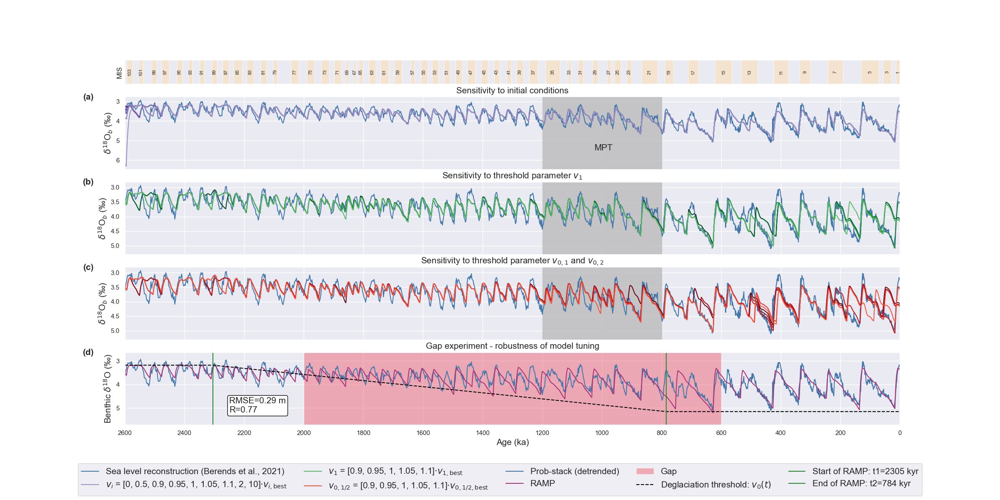

In [7]:
# font = 15
# title = None

# future_time=0

# # use seaborn theme
# # sns.set_theme()
# sns.set_style("dark")

# # switch off seaborn theme
# # plt.rcdefaults()

# plt.close('all')
# layout = [
#     ["A"],
#     ["B"],
#     ["C"],
#     ["D"],
#     ["E"]
# ]

# fig, ax = plt.subplot_mosaic(layout, figsize=(24,12), height_ratios=[1,3,3,3,3], sharex=True)

# ##############################################################################################################################################
# # 0st plot: MIS bounds
# ##############################################################################################################################################
# for start, end, label in bounds:
#     if start<=2600 and (int(label)%2!=0):
#         ax['A'].axvspan(start, end, facecolor='navajowhite', edgecolor=None, alpha=0.5)
#         if ((start+end)/2)<=2600:
#             # ax['A'].text(start+(end-start)/4, 0.5, label, ha='center', va='center', fontsize=8, rotation=90)
#             ax['A'].text((end+start)/2, 0.5, label, ha='center', va='center', fontsize=8, rotation=90)
# ax['A'].set_ylim(0, 1)
# ax['A'].set_yticks([])
# ax['A'].set_ylabel('MIS')
# ax['A'].set_xticks([])

# ##############################################################################################################################################
# # 1st plot: vi - sensitivity
# ##############################################################################################################################################
# cmap = cm.get_cmap("Purples_r", 9*2)

# ax['B'].plot(RAMP_data['time_sea'], RAMP_data['sea'], linestyle="-" , color=bright.blue, label="Sea level reconstruction (Berends et al., 2021)")
# ax['B'].plot(RAMP_data['time'], RAMP_data['icevolume_vi_0'], color=cmap(0))
# ax['B'].plot(RAMP_data['time'], RAMP_data['icevolume_vi_50'], color=cmap(1))
# ax['B'].plot(RAMP_data['time'], RAMP_data['icevolume_vi_90'], color=cmap(2))
# ax['B'].plot(RAMP_data['time'], RAMP_data['icevolume_vi_95'], color=cmap(3))
# ax['B'].plot(RAMP_data['time'], RAMP_data['icevolume_vi_100'], color=cmap(4))
# ax['B'].plot(RAMP_data['time'], RAMP_data['icevolume_vi_105'], color=cmap(5))
# ax['B'].plot(RAMP_data['time'], RAMP_data['icevolume_vi_110'], color=cmap(6))
# ax['B'].plot(RAMP_data['time'], RAMP_data['icevolume_vi_200'], color=cmap(7))
# ax['B'].plot(RAMP_data['time'], RAMP_data['icevolume_vi_1000'], color=cmap(8), label=rf'$v_i$ = [0, 0.5, 0.9, 0.95, 1, 1.05, 1.1, 2, 10]$\cdot v_{{i,\text{{best}}}}$')
# ax['B'].axvspan(1200, 800, color=bright.grey, alpha=0.8)
# ax['B'].axvspan(0, -250, color=bright.yellow, alpha=0.5)

# # ax['B'].text(x=2500, y=100, s=f"RMSE={rmse_ramp78_berends:.2f} m\nR={R_ramp78_berends:.2f}", fontsize=font, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.2'))
# ax['B'].text(x=1025, y=5.5, s=f"MPT", fontsize=font)

# ax['B'].set_xlim(-RAMP_data['start_year'], future_time)

# # ax['B'].set_ylim(-20, 130)

# ax['B'].invert_yaxis()
# ax['B'].set_ylabel(r"$\delta^{18}$O$_b$ (‰)", fontsize=font)
# ax['B'].set_xticks([])


# ##############################################################################################################################################
# # 2nd plot: v1 sensitivity
# ##############################################################################################################################################
# cmap = cm.get_cmap("Greens_r", 5*2)

# ax['C'].plot(RAMP_data['time_sea'], RAMP_data['sea'], linestyle="-" , color=bright.blue)
# ax['C'].plot(RAMP_data['time'], RAMP_data['icevolume_v1_90'], color=cmap(0))
# ax['C'].plot(RAMP_data['time'], RAMP_data['icevolume_v1_95'], color=cmap(1))
# ax['C'].plot(RAMP_data['time'], RAMP_data['icevolume_v1_100'], color=cmap(2))
# ax['C'].plot(RAMP_data['time'], RAMP_data['icevolume_v1_105'], color=cmap(3))
# ax['C'].plot(RAMP_data['time'], RAMP_data['icevolume_v1_110'], color=cmap(4), label=rf'$v_1$ = [0.9, 0.95, 1, 1.05, 1.1]$\cdot v_{{1,\text{{best}}}}$')
# ax['C'].axvspan(1200, 800, color=bright.grey, alpha=0.8)
# ax['C'].axvspan(0, -250, color=bright.yellow, alpha=0.5)

# # ax['C'].text(x=2500, y=100, s=f"RMSE={rmse_ramp78_berends:.2f} m\nR={R_ramp78_berends:.2f}", fontsize=font, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.2'))

# ax['C'].set_xlim(-RAMP_data['start_year'], future_time)

# # ax['C'].set_ylim(-20, 130)

# ax['C'].invert_yaxis()
# ax['C'].set_ylabel(r"$\delta^{18}$O$_b$ (‰)", fontsize=font)
# ax['C'].set_xticks([])

# ##############################################################################################################################################
# # 3rd plot: v0s sensitivity
# ##############################################################################################################################################
# cmap = cm.get_cmap("Reds_r", 5*2)

# ax['D'].plot(RAMP_data['time_sea'], RAMP_data['sea'], linestyle="-" , color=bright.blue)
# ax['D'].plot(RAMP_data['time'], RAMP_data['icevolume_v0_90'], color=cmap(0))
# ax['D'].plot(RAMP_data['time'], RAMP_data['icevolume_v0_95'], color=cmap(1))
# ax['D'].plot(RAMP_data['time'], RAMP_data['icevolume_v0_100'], color=cmap(2))
# ax['D'].plot(RAMP_data['time'], RAMP_data['icevolume_v0_105'], color=cmap(3))
# ax['D'].plot(RAMP_data['time'], RAMP_data['icevolume_v0_110'], color=cmap(4), label=rf'$v_{{0,1/2}}$ = [0.9, 0.95, 1, 1.05, 1.1]$\cdot v_{{0,1/2,\text{{best}}}}$')
# ax['D'].axvspan(1200, 800, color=bright.grey, alpha=0.8)
# ax['D'].axvspan(0, -250, color=bright.yellow, alpha=0.5)


# # ax['D'].text(x=2500, y=100, s=f"RMSE={rmse_ramp78_clark_d18Osw:.2f} ‰\nR={R_ramp78_clark_d18Osw:.2f}", fontsize=font, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.2'))

# ax['D'].set_xlim(-RAMP_data['start_year'], 0)

# # ax['D'].set_ylim(-0.2, 1.5)
# ax['D'].invert_yaxis()
# ax['D'].set_ylabel(r"$\delta^{18}$O$_b$ (‰)", fontsize=font)

# ##############################################################################################################################################
# # 4th plot: GAP
# ##############################################################################################################################################
# ax['E'].plot(GAP_data["time_sea"], GAP_data["sea"], linestyle="-" , color=bright.blue, label='Prob-stack (detrended)')
# ax['E'].plot(GAP_data["time"], GAP_data["icevolume"], color=bright.purple, label="RAMP")
# ax['E'].axvspan(xmin=-GAP_data["gap"][0], xmax=-GAP_data["gap"][1], facecolor=bright.red, alpha=0.5, label='Gap')
# ax['E'].axvspan(0, -250, color=bright.yellow, alpha=0.5)


# ax['E'].plot(GAP_data["time_bounds"], GAP_data["v0s"], linestyle="--" , color=bright.black, label=r"Deglaciation threshold: $v_0(t)$")
    
# plt.vlines(x=GAP_data["t1"], ymin=np.min([np.min(GAP_data["icevolume"]-0.1*np.abs(GAP_data["icevolume"])), np.min(GAP_data["sea"]-0.1*np.abs(GAP_data["sea"]))]), 
#                  ymax=np.max([np.max(GAP_data["icevolume"]+0.1*np.abs(GAP_data["icevolume"])), np.max(GAP_data["sea"]+0.1*np.abs(GAP_data["sea"]))]), 
#                  linestyle='-', color=bright.green, label=f'Start of RAMP: t1={int(GAP_data["t1"])} kyr')
# plt.vlines(x=GAP_data["t2"], ymin=np.min([np.min(GAP_data["icevolume"]-0.1*np.abs(GAP_data["icevolume"])), np.min(GAP_data["sea"]-0.1*np.abs(GAP_data["sea"]))]), 
#                  ymax=np.max([np.max(GAP_data["icevolume"]+0.1*np.abs(GAP_data["icevolume"])), np.max(GAP_data["sea"]+0.1*np.abs(GAP_data["sea"]))]), 
#                  linestyle='-', color=bright.green, label=f'End of RAMP: t2={int(GAP_data["t2"])} kyr')

# # ax2 = ax['E'].twinx()
# # ax2.plot(GAP_data["time"], GAP_data["state"], linewidth = 0.8, color=bright.grey, label='Model state')

# # # plt.xticks([0,100,200,300,400,500,600,700,800,900,1000,1100,1200,1300,1400,1500,1600,1700,1800,1900,2000])
# # # ax2.set_yticks([1,0], ['Interglacial', 'Glacial'], rotation=22.5)
# # ax2.set_yticks([1,0])
# ax['E'].set_xticks(np.arange(-GAP_data["start_year"], -GAP_data["future_time"]-1, -200))

# plt.xlim(-GAP_data["start_year"],-GAP_data["future_time"])
# ax['E'].set_ylim(np.min([np.min(GAP_data["icevolume"]-0.1*np.abs(GAP_data["icevolume"])), np.min(GAP_data["sea"]-0.1*np.abs(GAP_data["sea"]))]), 
#              np.max([np.max(GAP_data["icevolume"]+0.1*np.abs(GAP_data["icevolume"])), np.max(GAP_data["sea"]+0.1*np.abs(GAP_data["sea"]))]))
# # plt.gca().invert_yaxis()
# ax['E'].invert_yaxis()
# ax['E'].set_ylabel(r"Benthic $\delta^{18}$O (‰)", fontsize=font)
# ax['E'].text(x=2250, y=5.2, s=f"RMSE={GAP_data['rmse']:.2f} m\nR={GAP_data['R']:.2f}", fontsize=font, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.2'))
# # ax2.set_ylabel('Model state')





# # ##############################################################################################################################################
# # ##############################################################################################################################################
# # ##############################################################################################################################################

# ax['E'].set_xticks([2600,2400,2200,2000,1800,1600,1400,1200,1000,800,600,400,200,0])
# ax['E'].set_xlim(2600,0)
# ax['E'].set_xlabel("Age (ka)", fontsize=font)
# ax['B'].grid(True)
# ax['C'].grid(True)
# ax['D'].grid(True)
# ax['E'].grid(True)



# # Add panel label + title
# panel_label =['(a)', '(b)', '(c)', '(d)']
# panel_titles =['Sensitivity to initial conditions',
#                r'Sensitivity to threshold parameter $v_1$',
#                r'Sensitivity to threshold parameter $v_{0,1}$ and $v_{0,2}$',
#                r'Gap experiment - robustness of model tuning']
# for i, row in enumerate(['B', 'C', 'D', 'E']):
#     ax[row].text(-0.04, 1.05, panel_label[i], transform=ax[row].transAxes, fontsize=font, fontweight='bold', va='top', ha='right')
#     ax[row].set_title(panel_titles[i], fontsize=font)
#     # ax[row].set_yticks([0,20,40,60,80,100,120])
    
# fig.legend(ncol=5, loc=8, fontsize=font)
# fig.subplots_adjust(bottom=0.15) 

# if title!=None:
#     plt.title(title, fontsize=15)
# plt.savefig('Plots/f04.pdf', bbox_inches='tight') #, facecolor=(1,1,1,0)
# plt.show()

# S. SI Figures

## S.1. Figure S.1 - Comparison RAMP vs GRAD (L23)

In [16]:
# load pickled data sets
with open('Data/RAMP78_2Myr_Berends.pkl', 'rb') as file:
    RAMP78_2Myr_Berends_data = pickle.load(file)

with open('Data/Etienne_GRAD.pkl', 'rb') as file:
    GRAD_Etienne_data = pickle.load(file)


    
# calculate the rmse
rmse_ramp78_2Myr_berends = root_mean_squared_error(y_pred=RAMP78_2Myr_Berends_data['icevolume'][:len(RAMP78_2Myr_Berends_data['sea'])], y_true=RAMP78_2Myr_Berends_data['sea'])
rmse_etienne_GRAD = root_mean_squared_error(y_pred=GRAD_Etienne_data['icevolume'], y_true=GRAD_Etienne_data['sea'])

r2_ramp78_2Myr_berends = r2_score(y_pred=RAMP78_2Myr_Berends_data['icevolume'][:len(RAMP78_2Myr_Berends_data['sea'])], y_true=RAMP78_2Myr_Berends_data['sea'])
r2_etienne_GRAD = r2_score(y_pred=GRAD_Etienne_data['icevolume'], y_true=GRAD_Etienne_data['sea'])


R_ramp78_2Myr_berends = pearsonr(RAMP78_2Myr_Berends_data['icevolume'][:len(RAMP78_2Myr_Berends_data['sea'])], RAMP78_2Myr_Berends_data['sea'])[0]
R_etienne_GRAD = pearsonr(GRAD_Etienne_data['icevolume'], GRAD_Etienne_data['sea'])[0]


print(rmse_ramp78_2Myr_berends, rmse_etienne_GRAD)
print(r2_ramp78_2Myr_berends, r2_etienne_GRAD)
print(R_ramp78_2Myr_berends, R_etienne_GRAD)

12.79487161736549 13.869614712993886
0.7179547260156179 0.6685822568324178
0.8474244607725078 0.8190280249469791


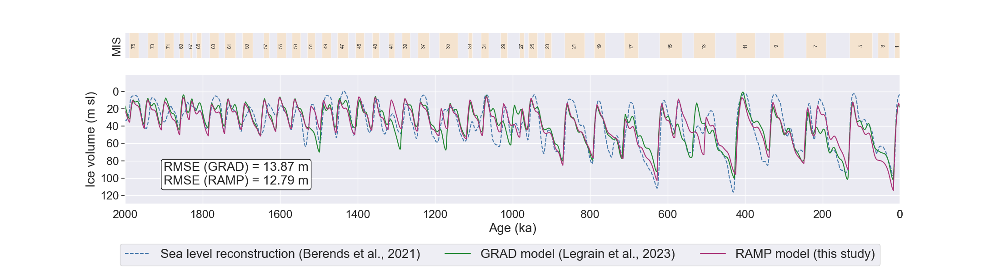

In [17]:
font = 20
title = None

future_time=0

sns.set_style("dark")

plt.close('all')
layout = [
    ["A"],
    ["B"]
]

fig, ax = plt.subplot_mosaic(layout, figsize=(22,6), height_ratios=[1,5], sharex=True)

##############################################################################################################################################
# 0st plot: MIS bounds
##############################################################################################################################################
for start, end, label in bounds:
    if start<=2000 and (int(label)%2!=0):
        ax['A'].axvspan(start, end, facecolor='navajowhite', edgecolor=None, alpha=0.5)
        if ((start+end)/2)<=2000:
            # ax['A'].text(start+(end-start)/4, 0.5, label, ha='center', va='center', fontsize=8, rotation=90)
            ax['A'].text((end+start)/2, 0.5, label, ha='center', va='center', fontsize=8, rotation=90)
ax['A'].set_xlim(2000, -future_time)
ax['A'].set_ylim(0, 1)
# ax['A'].set_xticks([])
ax['A'].set_yticks([])
ax['A'].set_ylabel('MIS')
ax['A'].set_xticks([])

# ax['F'].axis('off')
# ax['K'].axis('off')

##############################################################################################################################################
# 1st plot: RAMP 
##############################################################################################################################################
ax['B'].plot(RAMP78_2Myr_Berends_data['time_sea'], RAMP78_2Myr_Berends_data['sea'], linestyle="--" , color=bright.blue, label="Sea level reconstruction (Berends et al., 2021)")
ax['B'].plot(GRAD_Etienne_data['time'], GRAD_Etienne_data['icevolume'], color=bright.green, label='GRAD model (Legrain et al., 2023)')
ax['B'].plot(RAMP78_2Myr_Berends_data['time'], RAMP78_2Myr_Berends_data['icevolume'], color=bright.purple, label='RAMP model (this study)')
ax['B'].set_yticks([0 , 20, 40, 60, 80, 100, 120])

ax['B'].set_xlim(-RAMP78_2Myr_Berends_data['start_year'], -future_time)

ax['B'].set_ylim(-20, 130)

ax['B'].invert_yaxis()
ax['B'].set_ylabel("Ice volume (m sl)", fontsize=font)
ax['B'].set_xticks([])


ax2 = ax['B'].twinx()
ax2.text(x=1900, y=0.15, s=f"RMSE (GRAD) = {rmse_etienne_GRAD:.2f} m\nRMSE (RAMP) = {rmse_ramp78_2Myr_berends:.2f} m", fontsize=font, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.2'))




# ##############################################################################################################################################
# ##############################################################################################################################################
# ##############################################################################################################################################

ax['B'].set_xticks([2000,1800,1600,1400,1200,1000,800,600,400,200,0, -future_time])
ax['B'].set_xlabel("Age (ka)", fontsize=font)
ax['B'].grid(True)
ax2.set_yticks([])


fig.subplots_adjust(bottom=0.25)  # Adjust this value as needed
fig.legend(ncol=3, loc=8, fontsize=font)

if title!=None:
    plt.title(title, fontsize=15)
plt.savefig('Plots/SI-f01.pdf', bbox_inches='tight') #, facecolor=(1,1,1,0)
plt.show()

## S.2. Figure S.2 - Insolation

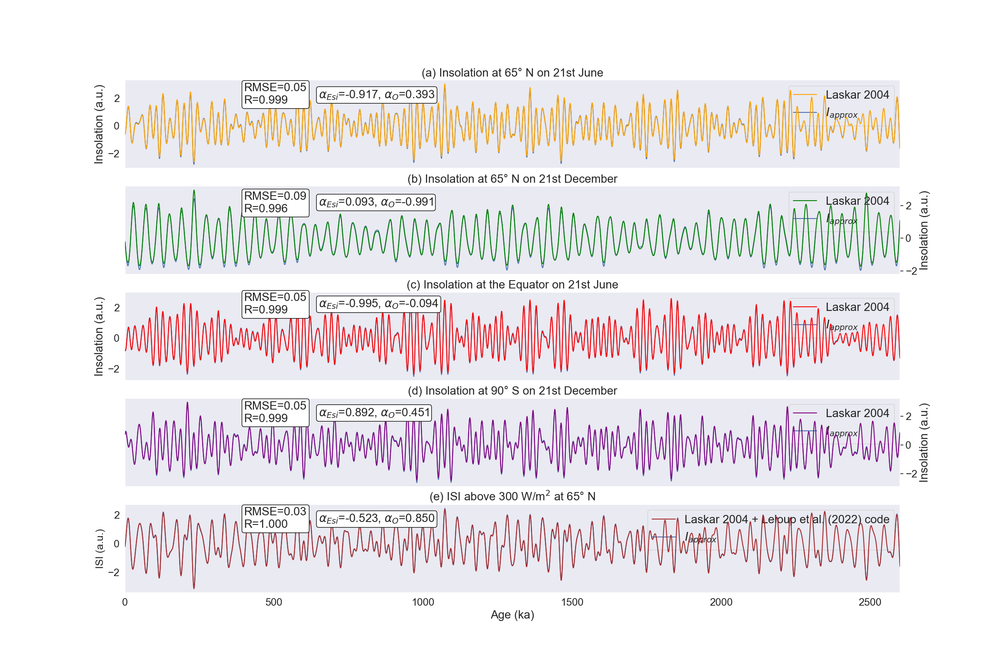

In [18]:
# Script to prove that a linear combination of Esi and Ob can reproduce most Insolation curves
font = 20

optimal_params = [(-0.917, 0.393),
                  (0.093, -0.991),
                  (-0.995, -0.094),
                  (0.892, 0.451),
                  (-0.523, 0.850)
                 ]


filenames = ['Laskar-SummerSolstice-65N-2Ma.txt',         # scenario=0
             'Laskar-WinterSolstice-65N-2Ma.txt',         # scenario=1
             'Laskar-SummerSolstice-Equator-2Ma.txt',     # scenario=2
             'Laskar-WinterSolstice-90S-2Ma.txt',         # scenario=3
             'ISI300.txt'                                 # scenario=4 
             ]
ylabels = ['Insolation (a.u.)\n(65°N, 21st June)', 'Insolation (a.u.)\n(65°N, 21st December)', 
           'Insolation (a.u.)\n(Equator, 21st June)', 'Insolation (a.u.)\n(90°S, 21st December)',
           'ISI above 300 W/m$^2$(a.u.)\n(65°N)'
           ]

titles = [r'(a) Insolation at 65° N on 21st June', 
             r'(b) Insolation at 65° N on 21st December', 
             r'(c) Insolation at the Equator on 21st June', 
             r'(d) Insolation at 90° S on 21st December',
             r'(e) ISI above 300 W/m$^2$ at 65° N'
             ]

def normalise(sample):
    m = np.mean(sample)
    std = np.std(sample)
    norm = (sample-m)/std
    return norm

def model(params):
    aEsi, aO = params
    I_modelled = aEsi*p_norm + aO*O_norm
    I_modelled = normalise(I_modelled)

    return I_modelled


fig, ax = plt.subplots(nrows=len(filenames), figsize=(24,16), sharex=True)

for i, file_name in enumerate(filenames):
    # for ISI above 300 W/m2
    if i==4:
        data_laskar = np.loadtxt('Data/Laskar-SummerSolstice-65N-2Ma.txt')
        p_laskar = data_laskar[:,1]
        O_laskar = data_laskar[:,2]
        
        data = np.loadtxt('Data/'+filenames[i])
        age = -1*data[:,0]
        I = data[:,1]
        
    # load Laskar data 
    else:    
        data_laskar = np.loadtxt('Data/'+filenames[i])
        age = -1*data_laskar[:,0]
        p_laskar = data_laskar[:,1]
        O_laskar = data_laskar[:,2]
        I = data_laskar[:,3]
    
    p_norm = normalise(p_laskar)
    O_norm = normalise(O_laskar)
    I_norm = normalise(I)
    
    I_model = model(optimal_params[i])
    
    rmse = root_mean_squared_error(y_true=I_norm, y_pred=I_model)
    R, p = pearsonr(I_norm, I_model)
    colors = ['orange', 'green', 'red', 'purple', 'brown']
    
    if i<4:
        ax[i].plot(age, I_norm, label='Laskar 2004', color=colors[i], zorder=10)
        ax[i].plot(age, I_model, label=r'$I_{approx}$')
        
        ax[i].text(x=400, y=1.6, s=f"RMSE={rmse:.2f}\nR={R:.3f}", bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.2'), fontsize=font, zorder=11)
        ax[i].text(x=650, y=2, s=rf"$ \alpha_{{Esi}}$={optimal_params[i][0]:.3f}, $ \alpha_{{O}}$={optimal_params[i][1]:.3f}", 
                   bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.2'), fontsize=font, zorder=11)
        ax[i].set_ylabel('Insolation (a.u.)', fontsize=font)
    else:
        ax[i].plot(age, I_norm, label='Laskar 2004 + Leloup et al. (2022) code', color=colors[i], zorder=10)
        ax[i].plot(age, I_model, label=r'$I_{approx}$')
        
        ax[i].text(x=400, y=1.1, s=f"RMSE={rmse:.2f}\nR={R:.3f}", bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.2'), fontsize=font, zorder=11)
        ax[i].text(x=650, y=1.5, s=rf"$ \alpha_{{Esi}}$={optimal_params[i][0]:.3f}, $ \alpha_{{O}}$={optimal_params[i][1]:.3f}", 
                   bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.2'), fontsize=font, zorder=11)
        ax[i].set_ylabel('ISI (a.u.)')
    if i%2:
        ax[i].yaxis.set_label_position("right")
        ax[i].yaxis.tick_right()
    ax[i].legend(loc=1, fontsize=font)
    ax[i].set_title(titles[i], loc='center', fontsize=font)
    ax[i].grid(False)
    
plt.xlabel('Age (ka)', fontsize=font)
plt.xlim(0, 2600)
plt.savefig('Plots/SI-f02.pdf', bbox_inches='tight')
plt.show()

## S.3. Figure S.3 - Bound/Threshold Plot

In [19]:
# load pickled data sets
with open('Data/RAMP78_2,6Myr_Berends.pkl', 'rb') as file:
    RAMP_data = pickle.load(file)
    

In [20]:
RAMP_data['rmse']

12.29042588916936

In [21]:
RAMP_data['state'][:11]

[0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1]

In [22]:
mask = []
states = np.where(np.array(RAMP_data['state'])==1, True, False)
        
state_times = RAMP_data['time'][states]
state_times = state_times[state_times>=0]
state_times[-100:]

array([867., 866., 865., 864., 863., 862., 861., 860., 790., 789., 788.,
       787., 786., 785., 784., 783., 713., 712., 711., 710., 709., 626.,
       625., 624., 623., 622., 621., 620., 619., 618., 617., 616., 579.,
       578., 577., 576., 575., 574., 573., 504., 503., 502., 501., 424.,
       423., 422., 421., 420., 419., 418., 417., 416., 415., 414., 413.,
       338., 337., 336., 335., 334., 333., 332., 331., 330., 329., 247.,
       246., 245., 244., 243., 242., 241., 240., 218., 217., 216., 215.,
       214., 133., 132., 131., 130., 129., 128., 127., 126., 125., 124.,
       123.,  16.,  15.,  14.,  13.,  12.,  11.,  10.,   9.,   8.,   7.,
         6.])

In [23]:
# Function to find continuous intervals
def find_intervals(time_array):
    intervals = []
    start = time_array[0]

    # step size
    step = RAMP_data['resolution']*1e-3
    
    for i in range(1, len(time_array)):
        if not math.isclose(time_array[i], time_array[i-1]-step):
        # if time_array[i]==time_array[i-1]-1:
            intervals.append((time_array[i-1], start))
            start = time_array[i]
    intervals.append((time_array[-1], start))
    return intervals

# Find glacial intervals
interglacial_intervals = find_intervals(state_times)
interglacial_intervals

[(2549.0, 2594.0),
 (2491.0, 2505.0),
 (2463.0, 2476.0),
 (2390.0, 2426.0),
 (2335.0, 2352.0),
 (2290.0, 2308.0),
 (2250.0, 2261.0),
 (2228.0, 2235.0),
 (2207.0, 2212.0),
 (2185.0, 2192.0),
 (2137.0, 2146.0),
 (2113.0, 2118.0),
 (2095.0, 2100.0),
 (2059.0, 2065.0),
 (2020.0, 2027.0),
 (1981.0, 1987.0),
 (1943.0, 1949.0),
 (1926.0, 1928.0),
 (1900.0, 1904.0),
 (1872.0, 1874.0),
 (1852.0, 1858.0),
 (1831.0, 1834.0),
 (1810.0, 1815.0),
 (1780.0, 1782.0),
 (1760.0, 1764.0),
 (1736.0, 1741.0),
 (1717.0, 1720.0),
 (1696.0, 1698.0),
 (1642.0, 1649.0),
 (1603.0, 1610.0),
 (1565.0, 1571.0),
 (1525.0, 1529.0),
 (1490.0, 1496.0),
 (1449.0, 1455.0),
 (1401.0, 1408.0),
 (1356.0, 1362.0),
 (1315.0, 1321.0),
 (1280.0, 1286.0),
 (1239.0, 1245.0),
 (1186.0, 1190.0),
 (1163.0, 1167.0),
 (1112.0, 1119.0),
 (1069.0, 1076.0),
 (1025.0, 1029.0),
 (976.0, 981.0),
 (954.0, 959.0),
 (860.0, 869.0),
 (783.0, 790.0),
 (709.0, 713.0),
 (616.0, 626.0),
 (573.0, 579.0),
 (501.0, 504.0),
 (413.0, 424.0),
 (329.0, 33

In [24]:
# Calculate Terminations (durations)
terminations = len(interglacial_intervals) + 1
# first glacial (if exist)
Ts = {'T1': interglacial_intervals[-1][0]-0}

for i in range(terminations-2):
    Ts[f'T{i+2}'] = interglacial_intervals[-(i+2)][0] - interglacial_intervals[-(i+1)][1] - 1

# last glacial (if exist)
Ts[f'T{terminations}'] = -RAMP_data['start_year'] - interglacial_intervals[0][1]

Ts

{'T1': 6.0,
 'T2': 106.0,
 'T3': 80.0,
 'T4': 21.0,
 'T5': 81.0,
 'T6': 74.0,
 'T7': 76.0,
 'T8': 68.0,
 'T9': 36.0,
 'T10': 82.0,
 'T11': 69.0,
 'T12': 69.0,
 'T13': 84.0,
 'T14': 16.0,
 'T15': 43.0,
 'T16': 39.0,
 'T17': 35.0,
 'T18': 43.0,
 'T19': 18.0,
 'T20': 48.0,
 'T21': 34.0,
 'T22': 28.0,
 'T23': 34.0,
 'T24': 38.0,
 'T25': 40.0,
 'T26': 34.0,
 'T27': 28.0,
 'T28': 35.0,
 'T29': 31.0,
 'T30': 31.0,
 'T31': 46.0,
 'T32': 18.0,
 'T33': 15.0,
 'T34': 18.0,
 'T35': 15.0,
 'T36': 27.0,
 'T37': 15.0,
 'T38': 17.0,
 'T39': 13.0,
 'T40': 25.0,
 'T41': 21.0,
 'T42': 14.0,
 'T43': 31.0,
 'T44': 32.0,
 'T45': 31.0,
 'T46': 29.0,
 'T47': 12.0,
 'T48': 18.0,
 'T49': 38.0,
 'T50': 14.0,
 'T51': 15.0,
 'T52': 14.0,
 'T53': 28.0,
 'T54': 26.0,
 'T55': 37.0,
 'T56': 36.0,
 'T57': 14.0,
 'T58': 43.0,
 'T59': 6.0}

In [25]:
glacial_end_idx = []
glacial_ends = []
step = RAMP_data['resolution']*1e-3
for interglacial_start in np.array(interglacial_intervals)[:,1]:
    glacial_end = interglacial_start+step
    idx = int((abs(RAMP_data['start_year'])-glacial_end)/step)

    glacial_ends.append(glacial_end)
    glacial_end_idx.append(idx)

print(glacial_ends[:5], glacial_end_idx[:5])

[2595.0, 2506.0, 2477.0, 2427.0, 2353.0] [5, 94, 123, 173, 247]


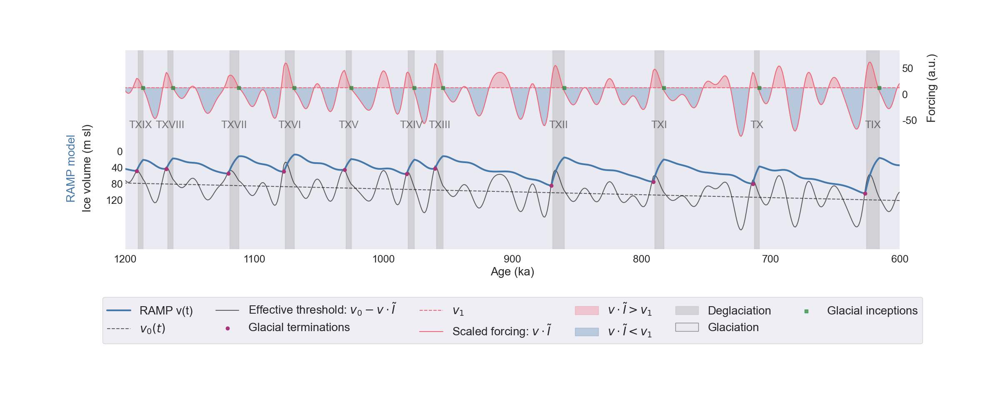

In [26]:
font = 20
title = None
clim_var = 'ice'

# use seaborn theme
# sns.set_theme()
sns.set_style("dark")

# switch off seaborn theme
# plt.rcdefaults()

plt.close('all')
fig, ax1 = plt.subplots(figsize=(24,10))

##############################################################################################################################################
# 3rd plot: GRAD
##############################################################################################################################################
# plt.plot(RAMP_data['time_sea'], RAMP_data['sea'], linestyle="-" , color=bright.blue)
ax1.plot(RAMP_data['time'], RAMP_data['icevolume'], color=bright.blue, label="RAMP v(t)", linewidth=3, zorder=9)
ax1.plot(RAMP_data['time_bounds'], RAMP_data['v0s'], color=bright.black, linestyle='--', alpha=0.6, label=r"$v_0(t)$")
ax1.plot(RAMP_data['time_bounds'], RAMP_data['v0_bounds'], color=bright.black, linestyle='-', alpha=0.6, label=r"Effective threshold: $v_0-v\cdot\tilde{I}$")


# mark intersection points between v and v_0(t)
# at first get indices of end points of glacial states
glacial_end_idx = []
glacial_ends = []
step = RAMP_data['resolution']*1e-3
for interglacial_start in np.array(interglacial_intervals)[:,1]:
    glacial_end = interglacial_start+step
    idx = int((abs(RAMP_data['start_year'])-glacial_end)/step)

    glacial_ends.append(glacial_end)
    glacial_end_idx.append(idx)

ax1.scatter(glacial_ends, RAMP_data['icevolume'][glacial_end_idx], color=bright.purple, zorder=10, label='Glacial terminations')


ax2 = ax1.twinx()
ax2.plot(RAMP_data['time_bounds'], RAMP_data['v1s'], linestyle='--', color=bright.red, alpha=1, label=r"$v_1$")
ax2.plot(RAMP_data['time_bounds'], RAMP_data['v1_bounds'], color=bright.red, alpha=1, label=r"Scaled forcing: $v\cdot\tilde{I}$")

# shade the area where insolation>=v1
ax2.fill_between(x=RAMP_data['time_bounds'], y1=RAMP_data['v1_bounds'], y2=RAMP_data['v1s'][0], where=(RAMP_data['v1_bounds'] >= RAMP_data['v1s'][0]), color=bright.red, alpha=0.3, label=r'$v\cdot\tilde{I}>v_1$')

# shade the area where insolation<v1
ax2.fill_between(x=RAMP_data['time_bounds'], y1=RAMP_data['v1_bounds'], y2=RAMP_data['v1s'][0], where=(RAMP_data['v1_bounds'] < RAMP_data['v1s'][0]), color=bright.blue, alpha=0.3, label=r'$v\cdot\tilde{I}<v_1$')


# mark position at end of interglacial for v1 
for i, interglacial_end in enumerate(np.array(interglacial_intervals)[:,0]):
    if i==0:
        ax2.scatter(interglacial_end, RAMP_data['v1s'][0], color=bright.green, marker='s', alpha=0.7, zorder=10, label='Glacial inceptions')    
    ax2.scatter(interglacial_end, RAMP_data['v1s'][0], color=bright.green, marker='s', alpha=0.7, zorder=10)

# Shade interglacial intervals
terminations = [
    "I", "II", "III", "IV", "V", "VI", "VII", "VIII", "IX", "X",
    "XI", "XII", "XIII", "XIV", "XV", "XVI", "XVII", "XVIII", "XIX", "XX",
    "XXI", "XXII", "XXIII", "XXIV", "XXV"]
for i, interval in enumerate(interglacial_intervals[::-1]):
    if i==0:
        ax1.axvspan(interval[1], interval[0], color=bright.grey, alpha=0.5, label='Deglaciation')
    ax1.axvspan(interval[1], interval[0], color=bright.grey, alpha=0.5)
    if i>7 and i<19:
        plt.text((interval[1]+interval[0])/2, -65, f'T{terminations[i]}', rotation=0, horizontalalignment='center', alpha=0.6, fontsize=font-2)


ax1.invert_yaxis()
ax1.invert_xaxis()

# ax1.set_yticks(ticks=[-170, 0, 20, 40, 60, 80, 100, 120], labels=['', '0', '20', '40', '60', '80', '100', '120'], fontsize=font)
ax1.set_yticks(ticks=[-250, 0, 40, 80, 120], labels=['', '0', '40', '80', '120'], fontsize=font-2)
ax2.set_yticks(ticks=[-300, -50, 0, 50], labels=['', '-50', '0', '50'], fontsize=font-2)
# ax1.set_yticks(ticks=[3, 4, 5, 6], labels=['3', '4', '5', '6'], fontsize=font-2)
# ax2.set_yticks(ticks=[-3, 1, 2, 3, 4, 5], labels=['', '1', '2', '3', '4', '5'], fontsize=font-2)
ax1.yaxis.set_tick_params(length=0,labelbottom=True)
ax2.yaxis.set_tick_params(length=0,labelbottom=False)

if clim_var=='bd18O':
    ax1.text(-0.055, 0.20, r'Benthic $\delta^{18}$O (‰)', rotation=90, transform=ax1.transAxes, fontsize=font)
elif clim_var=='d18Osw':
    ax1.text(-0.055, 0.20, r'Sea water $\delta^{18}$O (‰)', rotation=90, transform=ax1.transAxes, fontsize=font)
else:
    ax1.text(-0.055, 0.20, 'Ice volume (m sl)', rotation=90, transform=ax1.transAxes, fontsize=font)
    
ax1.text(-0.075, 0.25, 'RAMP model', color=bright.blue, rotation=90, transform=ax1.transAxes, fontsize=font)
ax2.text(1.035, 0.65, 'Forcing (a.u.)', rotation=90, transform=ax2.transAxes, fontsize=font)
# ax2.set_ylabel('Forcing (m sl)', fontsize=font)


##############################################################################################################################################
##############################################################################################################################################
##############################################################################################################################################


# plt.xticks([2000,1800,1600,1400,1200,1000,800,600,400,200,0])
ax1.set_xlabel("Age (ka)", fontsize=font)
ax1.set_xticks(ticks=np.arange(1200, 599, -100), labels=['1200', '1100', '1000', '900', '800', '700', '600'], fontsize=font-2)


# Add label for glaciation state
glacial_label = mpatches.Patch(facecolor=plt.gca().get_facecolor(), edgecolor='grey', label='Glaciation')

# Get the current handles and labels, add glacial_label
handles_ax1, labels_ax1 = ax1.get_legend_handles_labels()
handles_ax2, labels_ax2 = ax2.get_legend_handles_labels()
handles = np.hstack([handles_ax1, handles_ax2, glacial_label])
labels = np.hstack([labels_ax1, labels_ax2, 'Glaciation'])

# change position in legend, s.t. 'Deglaciation' and 'Glaciation' are adjacent -> looks nicer
def change_pos(in_arr, pick_idx, put_idx ):  
    new_arr = in_arr.copy()
    range_arr = np.arange(in_arr.size)  
    tmp = in_arr[pick_idx]
    new_arr[range_arr != put_idx ] = in_arr[range_arr != pick_idx]
    new_arr[put_idx] = tmp
    return new_arr

handles = change_pos(handles, 4, 9)
labels = change_pos(labels, 4, 9)
handles = list(change_pos(handles, 8, 10))
labels = list(change_pos(labels, 8, 10))


# handles.append(glacial_label)
# labels.append('Glaciation')
plt.legend(handles=handles, labels=labels, ncol=6, loc=8, fontsize=font, bbox_to_anchor=(0.5, -0.5)) # bbox_to_anchor=(0.5, -0.08), 

# fig.legend(ncol=5, loc=8, fontsize=font)
# plt.tight_layout()
plt.xlim(1200,600)
fig.subplots_adjust(bottom=0.4)  
if title!=None:
    plt.title(title, fontsize=font)
plt.savefig('Plots/SI-f03.pdf', bbox_inches='tight')
plt.show()

## S.4. Figure S.4 - Model comparison 2.6 Myr - RAMP-2

In [35]:
with open('Data/RAMP78_2,6Myr_Berends.pkl', 'rb') as file:
    RAMP78_Berends_data = pickle.load(file)

with open('Data/RAMP98_2,6Myr_Berends.pkl', 'rb') as file:
    RAMP98_Berends_2600ka_data = pickle.load(file)

with open('Data/RAMP98_2,6Myr_Clark.pkl', 'rb') as file:
    RAMP98_Clark_2600ka_data = pickle.load(file)

In [37]:
# calculate the rmse
rmse_ramp78_berends = root_mean_squared_error(y_pred=RAMP78_Berends_data['icevolume'][:len(RAMP78_Berends_data['sea'])], y_true=RAMP78_Berends_data['sea'])
rmse_ramp98_berends_2600ka = root_mean_squared_error(y_pred=RAMP98_Berends_2600ka_data['icevolume'][:len(RAMP98_Berends_2600ka_data['sea'])], y_true=RAMP98_Berends_2600ka_data['sea'])
rmse_ramp98_clark_2600ka = root_mean_squared_error(y_pred=RAMP98_Clark_2600ka_data['icevolume'][:len(RAMP98_Clark_2600ka_data['sea'])], y_true=RAMP98_Clark_2600ka_data['sea'])


r2_ramp78_berends = r2_score(y_pred=RAMP78_Berends_data['icevolume'][:len(RAMP78_Berends_data['sea'])], y_true=RAMP78_Berends_data['sea'])
r2_ramp98_berends_2600ka = r2_score(y_pred=RAMP98_Berends_2600ka_data['icevolume'][:len(RAMP98_Berends_2600ka_data['sea'])], y_true=RAMP98_Berends_2600ka_data['sea'])
r2_ramp98_clark_2600ka = r2_score(y_pred=RAMP98_Clark_2600ka_data['icevolume'][:len(RAMP98_Clark_2600ka_data['sea'])], y_true=RAMP98_Clark_2600ka_data['sea'])


R_ramp78_berends = pearsonr(RAMP78_Berends_data['icevolume'][:len(RAMP78_Berends_data['sea'])], RAMP78_Berends_data['sea'])[0]
R_ramp98_berends_2600ka = pearsonr(RAMP98_Berends_2600ka_data['icevolume'][:len(RAMP98_Berends_2600ka_data['sea'])], RAMP98_Berends_2600ka_data['sea'])[0]
R_ramp98_clark_2600ka = pearsonr(RAMP98_Clark_2600ka_data['icevolume'][:len(RAMP98_Clark_2600ka_data['sea'])], RAMP98_Clark_2600ka_data['sea'])[0]\


print(rmse_ramp78_berends, rmse_ramp98_berends_2600ka, rmse_ramp98_clark_2600ka)
print(r2_ramp78_berends, r2_ramp98_berends_2600ka, r2_ramp98_clark_2600ka)
print(R_ramp78_berends, R_ramp98_berends_2600ka, R_ramp98_clark_2600ka)

12.29042588916936 11.956623711758223 27.69864387774322
0.7391338174333786 0.7531113973603467 0.4763440261990657
0.8602640028319346 0.8707230665696272 0.6993170372492413


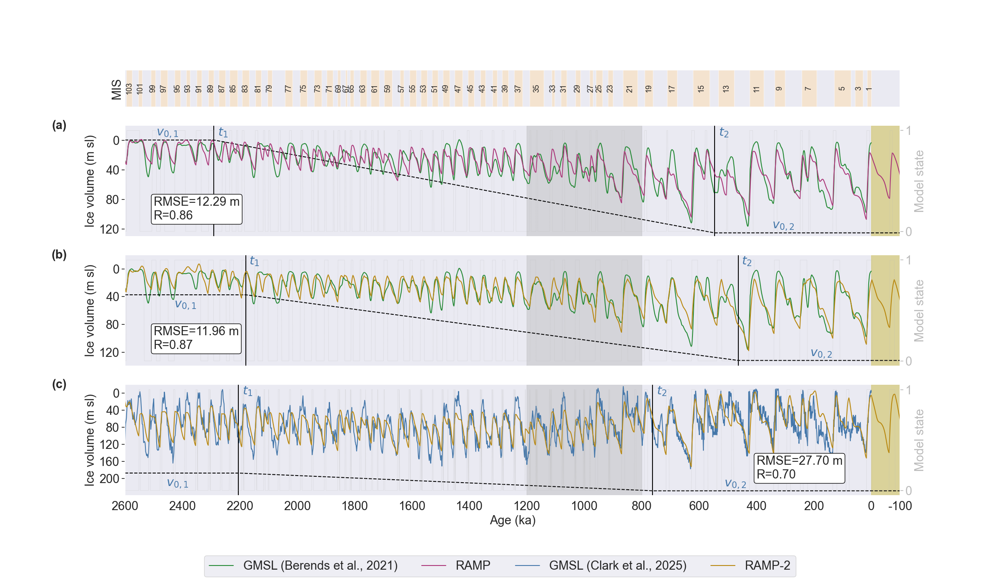

In [42]:
font = 21
title = None

future_time=100

# use seaborn theme
# sns.set_theme()
sns.set_style("dark")

# switch off seaborn theme
# plt.rcdefaults()

plt.close('all')
layout = [
    ["A"],
    ["B"],
    ["C"],
    ["D"]
]

fig, ax = plt.subplot_mosaic(layout, figsize=(24,14), height_ratios=[1,3,3,3])
# fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(16,14), sharex=True, height_ratios=[1,3,3,3])
# fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(24,14), sharex=True)

##############################################################################################################################################
# 0st plot: MIS bounds
##############################################################################################################################################
for start, end, label in bounds:
    if start<=2600 and (int(label)%2!=0):
        ax['A'].axvspan(start, end, facecolor='navajowhite', edgecolor=None, alpha=0.5)
        if ((start+end)/2)<=2600:
            # ax['A'].text(start+(end-start)/4, 0.5, label, ha='center', va='center', fontsize=8, rotation=90)
            ax['A'].text((end+start)/2, 0.5, label, ha='center', va='center', fontsize=font-8, rotation=90)
ax['A'].set_xlim(2600, -100)
ax['A'].set_ylim(0, 1)
# ax['A'].set_xticks([])
ax['A'].set_yticks([])
ax['A'].set_ylabel('MIS', fontsize=font)
ax['A'].set_xticks([])

##############################################################################################################################################
# 1st plot: Berends /w RAMP
##############################################################################################################################################
ax['B'].plot(RAMP78_Berends_data['time_sea'], RAMP78_Berends_data['sea'], linestyle="-" , color=bright.green, label='GMSL (Berends et al., 2021)')
ax['B'].plot(RAMP78_Berends_data['time_bounds'], RAMP78_Berends_data['v0s'], linestyle="--" , color=bright.black)
ax['B'].plot(RAMP78_Berends_data['time'], RAMP78_Berends_data['icevolume'], color=bright.purple, zorder=10, label='RAMP')
ax['B'].axvspan(1200, 800, color=bright.grey, alpha=0.45, zorder=1)
if future_time>0:
    ax['B'].axvspan(0, -250, color=bright.yellow, alpha=0.5)
ax['B'].vlines(x=RAMP78_Berends_data['t2'], ymin=RAMP78_Berends_data['v0s'].min()-40, ymax=130, linestyle='-', color=bright.black)
ax['B'].vlines(x=RAMP78_Berends_data['t1'], ymin=RAMP78_Berends_data['v0s'].min()-40, ymax=130, linestyle='-', color=bright.black)
ax['B'].text(x=RAMP78_Berends_data['t2']+200, y=np.min(RAMP78_Berends_data['v0s'])-6, s=r'$v_{0,1}$', color=bright.blue, fontsize=font)
ax['B'].text(x=RAMP78_Berends_data['t1']-200, y=np.max(RAMP78_Berends_data['v0s'])-6, s=r'$v_{0,2}$', color=bright.blue, fontsize=font)
ax['B'].text(x=RAMP78_Berends_data['t2']-15, y=-6, s=r'$t_{1}$', color=bright.blue, fontsize=font)
ax['B'].text(x=RAMP78_Berends_data['t1']-15, y=-6, s=r'$t_{2}$', color=bright.blue, fontsize=font)

ax2 = ax['B'].twinx()
ax2.plot(RAMP78_Berends_data['time'], RAMP78_Berends_data['state'], linewidth = 0.4, alpha=0.5, color=bright.grey, zorder=2)
ax2.set_ylabel('Model state', color=bright.grey)

ax2.set_yticks([1,0])
plt.yticks(fontsize=font)
ax2.tick_params(axis='y', colors=bright.grey)

ax2.text(x=2500, y=0.12, s=f"RMSE={rmse_ramp78_berends:.2f} m\nR={R_ramp78_berends:.2f}", fontsize=font, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.2'))

# ax['B'].set_xlim(-RAMP78_Berends_data['start_year'],-RAMP78_Berends_data['future_time'])
ax['B'].set_xlim(-RAMP78_Berends_data['start_year'], -future_time)
# ax['B'].set_ylim(np.min([np.min(ORB_data['v0']), np.min(ORB_data['icevolume']), np.min(ORB_data['sea'])])-10,
#                np.max([np.max(ORB_data['v0']), np.max(ORB_data['icevolume']), np.max(ORB_data['sea'])])+10)

ax['B'].set_ylim(-20, 130)

ax['B'].invert_yaxis()
ax['B'].set_ylabel("Ice volume (m sl)", fontsize=font)
# ax['B'].text(-0.05, 0.3, 'Ice volume (m sl)', rotation=90, transform=ax['B'].transAxes, fontsize=font)
# ax['B'].text(-0.07, 0.2, 'RAMP model', color=bright.black, rotation=90, transform=ax['B'].transAxes, fontsize=font)
ax['B'].set_xticks([])

ax2.set_ylabel('Model state', fontsize=font)


##############################################################################################################################################
# 2nd plot: Berends /w RAMP-2
##############################################################################################################################################
ax['C'].plot(RAMP98_Berends_2600ka_data['time_sea'], RAMP98_Berends_2600ka_data['sea'], linestyle="-" , color=bright.green)
ax['C'].plot(RAMP98_Berends_2600ka_data['time_bounds'], RAMP98_Berends_2600ka_data['v0s'], linestyle="--" , color=bright.black)
ax['C'].plot(RAMP98_Berends_2600ka_data['time'], RAMP98_Berends_2600ka_data['icevolume'], color='darkgoldenrod', zorder=10)
ax['C'].axvspan(1200, 800, color=bright.grey, alpha=0.45, zorder=1)
if future_time>0:
    ax['C'].axvspan(0, -250, color=bright.yellow, alpha=0.5)
ax['C'].vlines(x=-RAMP98_Berends_2600ka_data['t2'], ymin=-100, ymax=300, linestyle='-', color=bright.black)
ax['C'].vlines(x=-RAMP98_Berends_2600ka_data['t1'], ymin=-100, ymax=300, linestyle='-', color=bright.black)
ax['C'].text(x=-RAMP98_Berends_2600ka_data['t1']+250, y=np.min(RAMP98_Berends_2600ka_data['v0s'])+18, s=r'$v_{0,1}$', color=bright.blue, fontsize=font)
ax['C'].text(x=-RAMP98_Berends_2600ka_data['t2']-250, y=np.max(RAMP98_Berends_2600ka_data['v0s'])-6, s=r'$v_{0,2}$', color=bright.blue, fontsize=font)
ax['C'].text(x=-RAMP98_Berends_2600ka_data['t2']-12, y=-6, s=r'$t_{2}$', color=bright.blue, fontsize=font)
ax['C'].text(x=-RAMP98_Berends_2600ka_data['t1']-12, y=-6, s=r'$t_{1}$', color=bright.blue, fontsize=font)

ax2 = ax['C'].twinx()
ax2.plot(RAMP98_Berends_2600ka_data['time'], RAMP98_Berends_2600ka_data['state'], linewidth = 0.4, alpha=0.5, color=bright.grey, zorder=2)
ax2.set_ylabel('Model state', color=bright.grey)

ax2.set_yticks([1,0])
plt.yticks(fontsize=font)
ax2.tick_params(axis='y', colors=bright.grey)

# ax2.text(x=1050, y=0.9, s='MPT', color=bright.black, fontsize=font)
ax2.text(x=2500, y=0.12, s=f"RMSE={rmse_ramp98_berends_2600ka:.2f} m\nR={R_ramp98_berends_2600ka:.2f}", fontsize=font, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.2'))

# ax['C'].set_xlim(-RAMP98_Berends_2600ka_data['start_year'],-RAMP98_Berends_2600ka_data['future_time'])
ax['C'].set_xlim(-RAMP98_Berends_2600ka_data['start_year'], -future_time)
# ax['C'].set_ylim(np.min([np.min(ORB_data['v0']), np.min(ORB_data['icevolume']), np.min(ORB_data['sea'])])-10,
#                np.max([np.max(ORB_data['v0']), np.max(ORB_data['icevolume']), np.max(ORB_data['sea'])])+10)

ax['C'].set_ylim(-20, 140)

ax['C'].invert_yaxis()
ax['C'].set_ylabel("Ice volume (m sl)", fontsize=font)
# ax['C'].text(-0.05, 0.3, 'Ice volume (m sl)', rotation=90, transform=ax['B'].transAxes, fontsize=font)
# ax['C'].text(-0.07, 0.2, 'RAMP model', color=bright.black, rotation=90, transform=ax['B'].transAxes, fontsize=font)
ax['C'].set_xticks([])

ax2.set_ylabel('Model state', fontsize=font)



##############################################################################################################################################
# 3rd plot: Clark /w RAMP-2
##############################################################################################################################################
ax['D'].plot(RAMP98_Clark_2600ka_data['time_sea'], RAMP98_Clark_2600ka_data['sea'], linestyle="-" , color=bright.blue, label='GMSL (Clark et al., 2025)')
ax['D'].plot(RAMP98_Clark_2600ka_data['time_bounds'], RAMP98_Clark_2600ka_data['v0s'], linestyle="--" , color=bright.black)
ax['D'].plot(RAMP98_Clark_2600ka_data['time'], RAMP98_Clark_2600ka_data['icevolume'], color='darkgoldenrod', zorder=10, label='RAMP-2')
ax['D'].axvspan(1200, 800, color=bright.grey, alpha=0.45, zorder=1)
if future_time>0:
    ax['D'].axvspan(0, -250, color=bright.yellow, alpha=0.5)
ax['D'].vlines(x=-RAMP98_Clark_2600ka_data['t2'], ymin=-100, ymax=300, linestyle='-', color=bright.black)
ax['D'].vlines(x=-RAMP98_Clark_2600ka_data['t1'], ymin=-100, ymax=300, linestyle='-', color=bright.black)
ax['D'].text(x=-RAMP98_Clark_2600ka_data['t1']+250, y=np.min(RAMP98_Clark_2600ka_data['v0s'])+30, s=r'$v_{0,1}$', color=bright.blue, fontsize=font)
ax['D'].text(x=-RAMP98_Clark_2600ka_data['t2']-250, y=np.max(RAMP98_Clark_2600ka_data['v0s'])-10, s=r'$v_{0,2}$', color=bright.blue, fontsize=font)
ax['D'].text(x=-RAMP98_Clark_2600ka_data['t2']-15, y=3, s=r'$t_{2}$', color=bright.blue, fontsize=font)
ax['D'].text(x=-RAMP98_Clark_2600ka_data['t1']-15, y=3, s=r'$t_{1}$', color=bright.blue, fontsize=font)

ax2 = ax['D'].twinx()
ax2.plot(RAMP98_Clark_2600ka_data['time'], RAMP98_Clark_2600ka_data['state'], linewidth = 0.4, alpha=0.5, color=bright.grey, zorder=2)
ax2.set_ylabel('Model state', color=bright.grey)

ax2.set_yticks([1,0])
plt.yticks(fontsize=font)
ax2.tick_params(axis='y', colors=bright.grey)

# ax2.text(x=1050, y=0.9, s='MPT', color=bright.black, fontsize=font)
ax2.text(x=400, y=0.12, s=f"RMSE={rmse_ramp98_clark_2600ka:.2f} m\nR={R_ramp98_clark_2600ka:.2f}", fontsize=font, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.2'))

# ax['D'].set_xlim(-RAMP98_Clark_2600ka_data['start_year'],-RAMP98_Clark_2600ka_data['future_time'])
ax['D'].set_xlim(-RAMP98_Clark_2600ka_data['start_year'], -future_time)
# ax['D'].set_ylim(np.min([np.min(ORB_data['v0']), np.min(ORB_data['icevolume']), np.min(ORB_data['sea'])])-10,
#                np.max([np.max(ORB_data['v0']), np.max(ORB_data['icevolume']), np.max(ORB_data['sea'])])+10)

ax['D'].set_ylim(-20, 240)

ax['D'].invert_yaxis()
ax['D'].set_ylabel("Ice volume (m sl)", fontsize=font)
# ax['D'].text(-0.05, 0.3, 'Ice volume (m sl)', rotation=90, transform=ax['B'].transAxes, fontsize=font)
# ax['D'].text(-0.07, 0.2, 'RAMP model', color=bright.black, rotation=90, transform=ax['B'].transAxes, fontsize=font)
ax['D'].set_xticks([])

ax2.set_ylabel('Model state', fontsize=font)



# ##############################################################################################################################################
# ##############################################################################################################################################
# ##############################################################################################################################################

ax['D'].set_xticks([2600,2400,2200,2000,1800,1600,1400,1200,1000,800,600,400,200,0, -100], 
                   ['2600','2400','2200','2000','1800','1600','1400','1200','1000','800','600','400','200','0', '-100'], 
                   fontsize=font)
plt.yticks(fontsize=font)
ax['D'].set_xlabel("Age (ka)", fontsize=font)
ax['B'].grid(False)
ax['C'].grid(False)
ax['D'].grid(False)


# Add panel label 
panel_label =['(a)', '(b)', '(c)']
for i, row in enumerate(['B', 'C', 'D']):
    ax[row].text(-0.075, 1.05, panel_label[i], transform=ax[row].transAxes, fontsize=font, fontweight='bold', va='top', ha='right')
    
    if row == 'B':
        ax[row].set_yticks([0,40,80,120],
                           ['0','40','80','120'],
                           fontsize=font)
    if row == 'C':
        ax[row].set_yticks([0,40,80,120],
                           ['0','40','80','120'],
                           fontsize=font)
    if row == 'D':
        ax[row].set_yticks([0,40,80,120,160, 200],
                           ['0','40','80','120','160', '200'],
                           fontsize=font)


fig.legend(ncol=4, loc=8, fontsize=font)
# plt.tight_layout()
plt.subplots_adjust(bottom=0.15)

if title!=None:
    plt.title(title, fontsize=15)

plt.savefig('Plots/SI-f04.pdf', bbox_inches='tight') #, facecolor=(1,1,1,0)
plt.show()

## S.5. Figure S.5 - Scalograms - RAMP-2

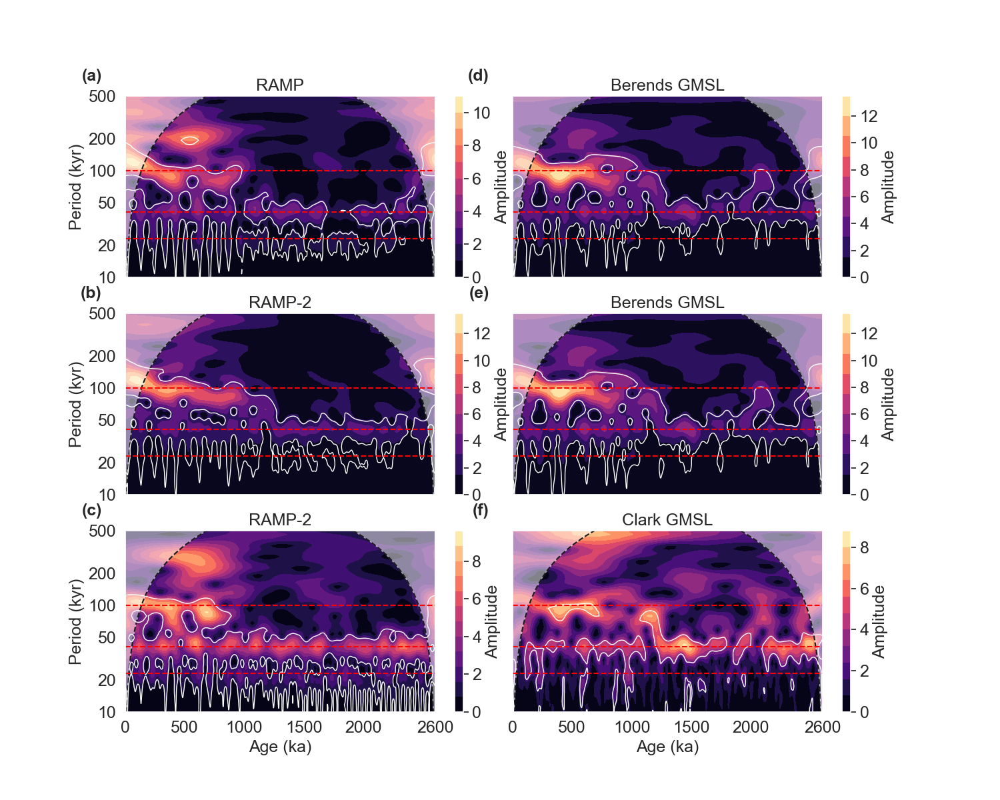

In [43]:
title = None

future_time=100
font=18

# use seaborn theme
# sns.set_theme()
sns.set_style("dark")

# switch off seaborn theme
# plt.rcdefaults()

plt.close('all')
layout = [
    ["A", "D"],
    ["B", "E"],
    ["C", "F"]
]

fig, ax = plt.subplot_mosaic(layout, figsize=(15,12))
# fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(16,14), sharex=True, height_ratios=[1,3,3,3])
# fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(24,14), sharex=True)


##############################################################################################################################################
# 1st plot: Berends /w RAMP
##############################################################################################################################################

# SCALOGRAM - RAMP
#############
# IEVOLUME
ts_icevolume = pyleo.Series(time=RAMP78_Berends_data['time'][:-250], value=RAMP78_Berends_data['icevolume'][:-250], 
                            time_name='Age', time_unit='ka', 
                            value_name='Icevolume', value_unit='m Sl', 
                            verbose=False)
# psd_icevolume = ts_icevolume.spectral()
scal_sig_ar1asym_icevolume = ts_icevolume.wavelet(freq_kwargs={'fmin':1/500,'fmax':1/10,'nf':50}).signif_test(method='ar1asym')

# fig, ax = ts_icevolume.summary_plot(psd_icevolume.beta_est(), scal_sig_ar1asym_icevolume, figsize=(20,8))
scal_sig_ar1asym_icevolume.plot(figsize=(20,8), ax=ax['A'], xlabel='', ylabel='Period (kyr)', title='RAMP', plot_cb=True, cbar_style={'ticks':np.arange(0,13,2)})
ax['A'].set_xticks(np.hstack([0, np.arange(0, -RAMP78_Berends_data['start_year']+1, 200)]))
ax['A'].hlines(y=[23, 41, 100], xmin=0, xmax=-RAMP78_Berends_data['start_year'], colors='red', linestyles='--')
# ax['A'].vlines(0, 10, 500, colors='grey', linestyles='--', linewidth=3)
ax['A'].set_xticks([])

# SCALOGRAM - Berends
#############
# IEVOLUME
ts_icevolume = pyleo.Series(time=RAMP78_Berends_data['time_sea'], value=RAMP78_Berends_data['sea'], 
                            time_name='Age', time_unit='ka', 
                            value_name='Icevolume', value_unit='m Sl', 
                            verbose=False)
# psd_icevolume = ts_icevolume.spectral()
scal_sig_ar1asym_icevolume = ts_icevolume.wavelet(freq_kwargs={'fmin':1/500,'fmax':1/10,'nf':50}).signif_test(method='ar1asym')

scal_sig_ar1asym_icevolume.plot(figsize=(20,8), ax=ax['D'], xlabel='', ylabel='', yticks=[], title='Berends GMSL', plot_cb=True, cbar_style={'ticks':np.arange(0,13,2)})
ax['D'].set_xticks(np.hstack([0, np.arange(0, -RAMP78_Berends_data['start_year']+1, 200)]))
ax['D'].hlines(y=[23, 41, 100], xmin=0, xmax=-RAMP78_Berends_data['start_year'], colors='red', linestyles='--')
# ax['D'].vlines(0, 10, 500, colors='grey', linestyles='--', linewidth=3)
ax['D'].set_xticks([])

##############################################################################################################################################
# 2nd plot: Berends /w RAMP-2
##############################################################################################################################################

# SCALOGRAM - RAMP
#############
# IEVOLUME
ts_icevolume = pyleo.Series(time=RAMP98_Berends_2600ka_data['time'][:-250], value=RAMP98_Berends_2600ka_data['icevolume'][:-250], 
                            time_name='Age', time_unit='ka', 
                            value_name='Icevolume', value_unit='m Sl', 
                            verbose=False)
# psd_icevolume = ts_icevolume.spectral()
scal_sig_ar1asym_icevolume = ts_icevolume.wavelet(freq_kwargs={'fmin':1/500,'fmax':1/10,'nf':50}).signif_test(method='ar1asym')

# fig, ax = ts_icevolume.summary_plot(psd_icevolume.beta_est(), scal_sig_ar1asym_icevolume, figsize=(20,8))
scal_sig_ar1asym_icevolume.plot(figsize=(20,8), ax=ax['B'], xlabel='', ylabel='Period (kyr)', title='RAMP-2', plot_cb=True, cbar_style={'ticks':np.arange(0,13,2)})
ax['B'].set_xticks(np.hstack([0, np.arange(0, -RAMP98_Berends_2600ka_data['start_year']+1, 200)]))
ax['B'].hlines(y=[23, 41, 100], xmin=0, xmax=-RAMP98_Berends_2600ka_data['start_year'], colors='red', linestyles='--')
# ax['B'].vlines(0, 10, 500, colors='grey', linestyles='--', linewidth=3)
ax['B'].set_xticks([])

# SCALOGRAM - Berends
#############
# IEVOLUME
ts_icevolume = pyleo.Series(time=RAMP98_Berends_2600ka_data['time_sea'], value=RAMP98_Berends_2600ka_data['sea'], 
                            time_name='Age', time_unit='ka', 
                            value_name='Icevolume', value_unit='m Sl', 
                            verbose=False)
# psd_icevolume = ts_icevolume.spectral()
scal_sig_ar1asym_icevolume = ts_icevolume.wavelet(freq_kwargs={'fmin':1/500,'fmax':1/10,'nf':50}).signif_test(method='ar1asym')

scal_sig_ar1asym_icevolume.plot(figsize=(20,8), ax=ax['E'], xlabel='', ylabel='', yticks=[], title='Berends GMSL', plot_cb=True, cbar_style={'ticks':np.arange(0,13,2)})
ax['E'].set_xticks(np.hstack([0, np.arange(0, -RAMP98_Berends_2600ka_data['start_year']+1, 200)]))
ax['E'].hlines(y=[23, 41, 100], xmin=0, xmax=-RAMP98_Berends_2600ka_data['start_year'], colors='red', linestyles='--')
# ax['E'].vlines(0, 10, 500, colors='grey', linestyles='--', linewidth=3)
ax['E'].set_xticks([])


##############################################################################################################################################
# 3rd plot: Clark /w RAMP-2
##############################################################################################################################################

# SCALOGRAM - RAMP
#############
# IEVOLUME
ts_icevolume = pyleo.Series(time=RAMP98_Clark_2600ka_data['time'][:-250], value=RAMP98_Clark_2600ka_data['icevolume'][:-250], 
                            time_name='Age', time_unit='ka', 
                            value_name='Icevolume', value_unit='m Sl', 
                            verbose=False)
# psd_icevolume = ts_icevolume.spectral()
scal_sig_ar1asym_icevolume = ts_icevolume.wavelet(freq_kwargs={'fmin':1/500,'fmax':1/10,'nf':50}).signif_test(method='ar1asym')

# fig, ax = ts_icevolume.summary_plot(psd_icevolume.beta_est(), scal_sig_ar1asym_icevolume, figsize=(20,8))
scal_sig_ar1asym_icevolume.plot(figsize=(20,8), ax=ax['C'], xlabel='', ylabel='Period (kyr)', title='RAMP-2', plot_cb=True, cbar_style={'ticks':np.arange(0,13,2)})
ax['C'].set_xticks(np.hstack([0, np.arange(0, -RAMP98_Clark_2600ka_data['start_year']+1, 200)]))
ax['C'].hlines(y=[23, 41, 100], xmin=0, xmax=-RAMP98_Clark_2600ka_data['start_year'], colors='red', linestyles='--')
# ax['C'].vlines(0, 10, 500, colors='grey', linestyles='--', linewidth=3)
ax['C'].set_xticks([])

# SCALOGRAM - Clark
#############
# IEVOLUME
ts_icevolume = pyleo.Series(time=RAMP98_Clark_2600ka_data['time_sea'], value=RAMP98_Clark_2600ka_data['sea'], 
                            time_name='Age', time_unit='ka', 
                            value_name='Icevolume', value_unit='m Sl', 
                            verbose=False)
# psd_icevolume = ts_icevolume.spectral()
scal_sig_ar1asym_icevolume = ts_icevolume.wavelet(freq_kwargs={'fmin':1/500,'fmax':1/10,'nf':50}).signif_test(method='ar1asym')

scal_sig_ar1asym_icevolume.plot(figsize=(20,8), ax=ax['F'], xlabel='', ylabel='', yticks=[], title='Clark GMSL', plot_cb=True, cbar_style={'ticks':np.arange(0,13,2)})
ax['F'].set_xticks(np.hstack([0, np.arange(0, -RAMP98_Clark_2600ka_data['start_year']+1, 200)]))
ax['F'].hlines(y=[23, 41, 100], xmin=0, xmax=-RAMP98_Clark_2600ka_data['start_year'], colors='red', linestyles='--')
# ax['F'].vlines(0, 10, 500, colors='grey', linestyles='--', linewidth=3)
ax['F'].set_xticks([])



# # ##############################################################################################################################################
# # ##############################################################################################################################################
# # ##############################################################################################################################################

# ax['D'].set_xticks(np.hstack([0, np.arange(0, -RAMP78_Clark_d18Osw_data['start_year']+1, 200)]))
ax['C'].set_xticks([0, 500, 1000, 1500, 2000, 2600])
ax['C'].set_xlabel('Age (ka)')
# # ax['H'].set_xticks(np.hstack([0, np.arange(0, -RAMP78_Clark_d18Osw_data['start_year']+1, 200)]))
ax['F'].set_xticks([0, 500, 1000, 1500, 2000, 2600])
ax['F'].set_xlabel('Age (ka)')



# Add panel label 
panel_label =['(a)', '(b)', '(c)', '(d)', '(e)', '(f)']
for i, row in enumerate(['A', 'B', 'C', 'D', 'E', 'F']):
    ax[row].text(-0.075, 1.15, panel_label[i], transform=ax[row].transAxes, fontsize=font, fontweight='bold', va='top', ha='right')


# fig.legend(ncol=4, loc=8, fontsize=font)
# plt.tight_layout()
plt.subplots_adjust(wspace=0)

if title!=None:
    plt.title(title, fontsize=font)
plt.savefig('Plots/SI-f05.pdf', bbox_inches='tight') #, facecolor=(1,1,1,0)
plt.show()